In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import scirpy as ir
from matplotlib import pyplot as plt, cm as mpl_cm
from cycler import cycler

sc.set_figure_params(figsize=(4, 4))
sc.settings.verbosity = 2  # verbosity: errors (0), warnings (1), info (2), hints (3)

In [3]:
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr

import anndata2ri
import rpy2.rinterface_lib.callbacks
import logging
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

anndata2ri.activate()
%load_ext rpy2.ipython

In [4]:
%run /home/maolp/Main_Gao_ScanpyProject20231130/HFB_script_in_save/TCRutil.py

In [5]:
%%R
source("/home/maolp/Main_Gao_ScanpyProject20231130/HFB_script_in_save/TCRheatmap.R")

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.1     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.3     ✔ tibble    3.2.1
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.1     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


In [6]:
sc.logging.print_header()

scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==1.5.3 scikit-learn==1.0 statsmodels==0.13.5 python-igraph==0.10.4 louvain==0.8.0 pynndescent==0.5.8


In [7]:
adata=sc.read_h5ad('/home/maolp/data5/Gaofeng_All_matrix/Allcount/All_scanpyData/Data/Scanpy_lastCell_TCR.h5ad')

In [8]:
adata

AnnData object with n_obs × n_vars = 58301 × 31424
    obs: 'Name', 'doublet_scores', 'predicted_doublets', 'predicted_labels', 'over_clustering', 'majority_voting', 'conf_score', 'Cellname', 'AdjustedID', 'New_Body', 'Week', 'TCRBCRlabel', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Last_cell_type', 'Cell_lineage', 'Last_cell_type2', 'Last_cell_type_num', 'Last_cell_type_num2', 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR

In [9]:
# https://www.imgt.org/IMGTrepertoire/index.php?section=LocusGenes&repertoire=GeneOrder&species=human&group=TRA
TRAIMGT=pd.read_csv('/home/maolp/Main_Gao_ScanpyProject20231130/HFB_script_in_save/TCRgene/TRAlocus.csv')
TRBIMGT=pd.read_csv('/data5/maolp/Gaofeng_All_matrix/Allcount/Last_All_scanpyData_V3//TCRFigure/TRBlocus.csv')


In [10]:
TRBIMGT

,IMGT_gene_name,IMGT_gene_order,IMGT_gene_orientation_in_locus
0,TRBV1,1,direct
1,TRBV2,2,direct
2,TRBV3-1,3,direct
3,TRBV4-1,4,direct
4,TRBV5-1,5,direct
...,...,...,...
86,TRBJ2-5,87,direct
87,TRBJ2-6,88,direct
88,TRBJ2-7,89,direct
89,TRBC2,90,direct


In [11]:
adata.obs[[ 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus',]]

,IR_VDJ_2_duplicate_count,IR_VJ_1_j_call,IR_VJ_2_j_call,IR_VDJ_1_j_call,IR_VDJ_2_j_call,IR_VJ_1_junction,IR_VJ_2_junction,IR_VDJ_1_junction,IR_VDJ_2_junction,IR_VJ_1_junction_aa,IR_VJ_2_junction_aa,IR_VDJ_1_junction_aa,IR_VDJ_2_junction_aa,IR_VJ_1_locus,IR_VJ_2_locus
Cellname,,,,,,,,,,,,,,,
Z48_AAAGCAACATGACGGA-1,9.0,TRAJ20,NaN,TRBJ2-3,TRBJ2-7,TGTGCTCTAAGTGGGACTAACGACTACAAGCTCAGCTTT,NaN,TGTGCCAGCAGTTTAGGGGGACAAAACACAGATACGCAGTATTTT,TGTGCCAGCTCACCCCTAGCGGGCTCCTACGAGCAGTACTTC,CALSGTNDYKLSF,NaN,CASSLGGQNTDTQYF,CASSPLAGSYEQYF,TRA,NaN
Z48_AACCGCGGTTGGTGGA-1,NaN,TRAJ22,NaN,TRBJ2-2,NaN,TGTGCTCTGAGTTCTGGTTCTGCAAGGCAACTGACCTTT,NaN,TGTGCCAGCAGCTTAGCTAGCGGGGGGGCCGGGGAGCTGTTTTTT,NaN,CALSSGSARQLTF,NaN,CASSLASGGAGELFF,NaN,TRA,NaN
Z48_AACCGCGTCCAAACTG-1,NaN,TRAJ42,NaN,TRBJ2-5,NaN,TGTGCCTTTATGGGAAGCCAAGGAAATCTCATCTTT,NaN,TGTGCCAGTAGTATCAGGGGAGAGACCCAGTACTTC,NaN,CAFMGSQGNLIF,NaN,CASSIRGETQYF,NaN,TRA,NaN
Z48_AACTCAGAGGTGCAAC-1,NaN,TRAJ8,NaN,TRBJ1-1,NaN,TGTGCTGTGGGAGGCTTTCAGAAACTTGTATTT,NaN,TGTGCCAGCAGTTACTCGAGGGACAACACTGAAGCTTTCTTT,NaN,CAVGGFQKLVF,NaN,CASSYSRDNTEAFF,NaN,TRA,NaN
Z48_AACTTTCAGACATAAC-1,NaN,TRAJ6,NaN,TRBJ1-4,NaN,TGTGCAGCAAGTATAGGAGGAAGCTACATACCTACATTT,NaN,TGTGCCAGCAGCTTAGGACATAATGAAAAACTGTTTTTT,NaN,CAASIGGSYIPTF,NaN,CASSLGHNEKLFF,NaN,TRA,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Z123_TTTGTCACACTGTTAG-1,NaN,TRAJ54,NaN,TRBJ1-2,NaN,TGTGCAGCAAGCATTCAGGGAGCCCAGAAGCTGGTATTT,NaN,TGTGCCAGCAGCCAAGAGGGATACTATGGCTACACCTTC,NaN,CAASIQGAQKLVF,NaN,CASSQEGYYGYTF,NaN,TRA,NaN
Z123_TTTGTCACATTTGCTT-1,NaN,TRAJ31,NaN,TRBJ1-2,NaN,TGTGCAGCAAGCAAGAACAATGCCAGACTCATGTTT,NaN,TGCAGTGCCAGCGAGGGCGCGGATGTCTACACCTTC,NaN,CAASKNNARLMF,NaN,CSASEGADVYTF,NaN,TRA,NaN
Z123_TTTGTCAGTAAGTGTA-1,NaN,TRAJ40,NaN,TRBJ1-1,NaN,TGTGCAGCAAGCTATACCTCAGGAACCTACAAATACATCTTT,NaN,TGTGCCAGCAGTTACCCTGGGACAGAAGCTTTCTTT,NaN,CAASYTSGTYKYIF,NaN,CASSYPGTEAFF,NaN,TRA,NaN


In [12]:
TRBIMGT_V=TRBIMGT[TRBIMGT['IMGT_gene_name'].str.contains('BV', na=False)]
TRBIMGT_V

,IMGT_gene_name,IMGT_gene_order,IMGT_gene_orientation_in_locus
0,TRBV1,1,direct
1,TRBV2,2,direct
2,TRBV3-1,3,direct
3,TRBV4-1,4,direct
4,TRBV5-1,5,direct
...,...,...,...
63,TRBV27,64,direct
64,TRBVC,65,opposite
65,TRBV28,66,direct
66,TRBV29-1,67,direct


In [13]:
TRAIMGT_V=TRAIMGT[TRAIMGT['IMGT_gene_name'].str.contains('AV', na=False)]
TRAIMGT_V

,IMGT_gene_name,IMGT_locus_gene_order,IMGT gene orientation in locus
0,TRAV1-1,1,direct
1,TRAV1-2,2,direct
2,TRAV2,3,direct
3,TRAV3,4,direct
4,TRAV4,5,direct
...,...,...,...
57,TRAV38-2/DV8,58,direct
58,TRAV39,59,direct
59,TRAV40,60,direct
60,TRAV41,61,direct


In [14]:
TRBVlist_values = TRBIMGT_V['IMGT_gene_name'].values.tolist()
TRAVlist_values = TRAIMGT_V['IMGT_gene_name'].values.tolist()


In [15]:
import pandas as pd


TRAIMGT = pd.read_csv('~/Main_Gao_ScanpyProject20231130/HFB_script_in_save/TCRgene/Gene/TRAgenelocus.csv')
TRBIMGT = pd.read_csv('~/Main_Gao_ScanpyProject20231130/HFB_script_in_save/TCRgene/Gene/TRBlocus.csv')

TRBJIMGT = TRBIMGT[TRBIMGT['IMGT_gene_name'].str.contains('TRBJ')]['IMGT_gene_name'].values.tolist()


TRAJIMGT = TRAIMGT[TRAIMGT['IMGT_gene_name'].str.contains('TRAJ')]['IMGT_gene_name'].values.tolist()

In [89]:
TRBDIMGT=['TRBD1','TRBD2']

In [17]:
adataPBMC=adata[adata.obs['New_Body'].isin(['PBMC'])]

In [18]:
calculate_TCRVDJ_heatmap

<function __main__.calculate_TCRVDJ_heatmap(input_adata, input_TRBVlist_values, input_IR='IR_VDJ_1_v_call', input_cell_type='Naïve CD4 T', input_adjusted_id='T12.P25')>

/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_script_in_save/TCRutil.py:9: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  selected_adata.obs['Organ_cell_type'] = selected_adata.obs['Last_cell_type'].astype('str') + "_" + selected_adata.obs['AdjustedID'].astype('str')


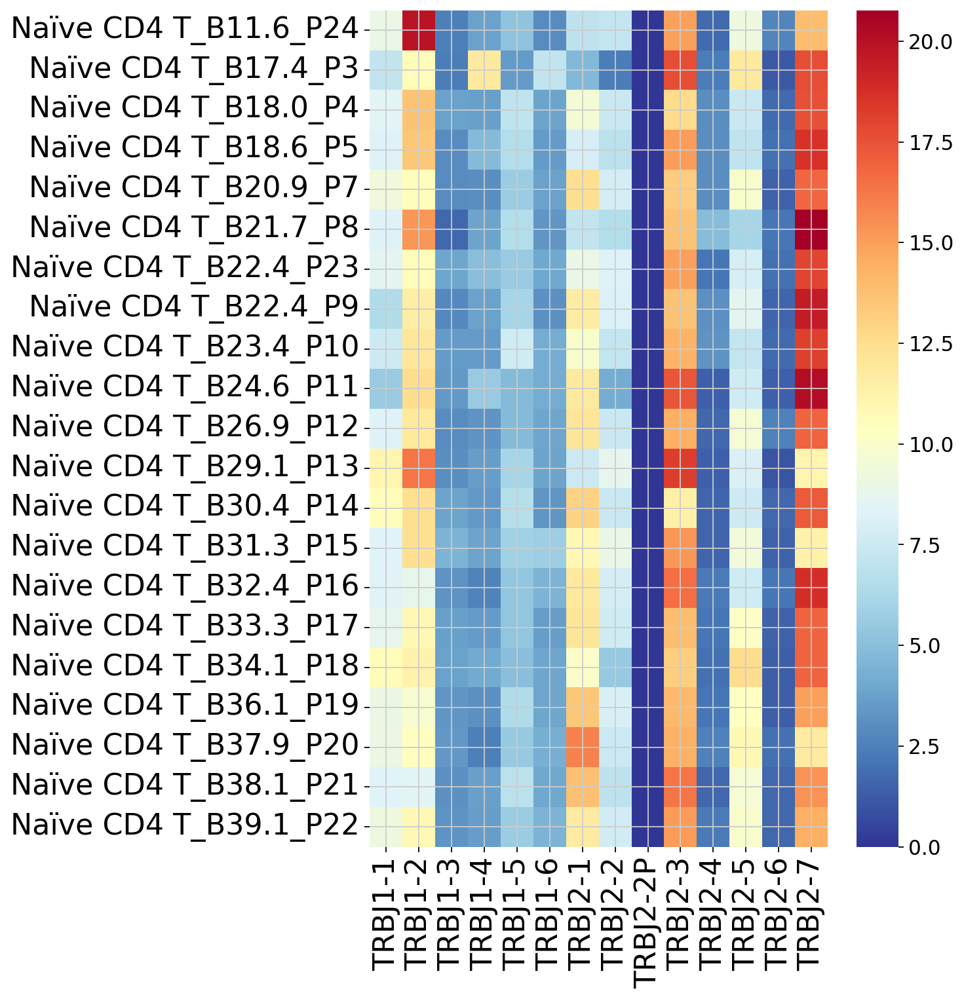

In [19]:
CD8_TRBJ_chain, fig = calculate_TCRVDJ_heatmap(adataPBMC, TRBJIMGT,input_IR='IR_VDJ_1_j_call')

/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_script_in_save/TCRutil.py:9: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  selected_adata.obs['Organ_cell_type'] = selected_adata.obs['Last_cell_type'].astype('str') + "_" + selected_adata.obs['AdjustedID'].astype('str')


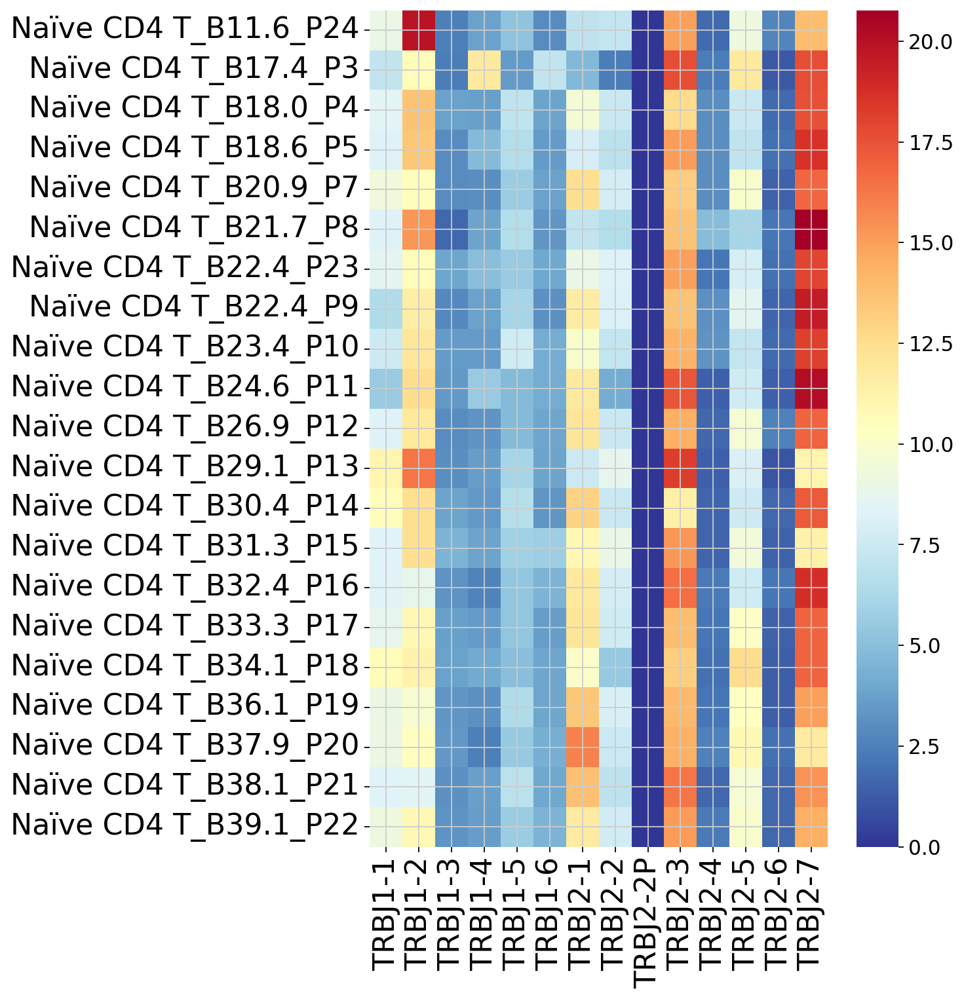

In [20]:
CD4_TRBJ_chain, fig = calculate_TCRVDJ_heatmap(adataPBMC, TRBJIMGT,input_IR='IR_VDJ_1_j_call',input_cell_type='Naïve CD4 T')


/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_script_in_save/TCRutil.py:9: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  selected_adata.obs['Organ_cell_type'] = selected_adata.obs['Last_cell_type'].astype('str') + "_" + selected_adata.obs['AdjustedID'].astype('str')


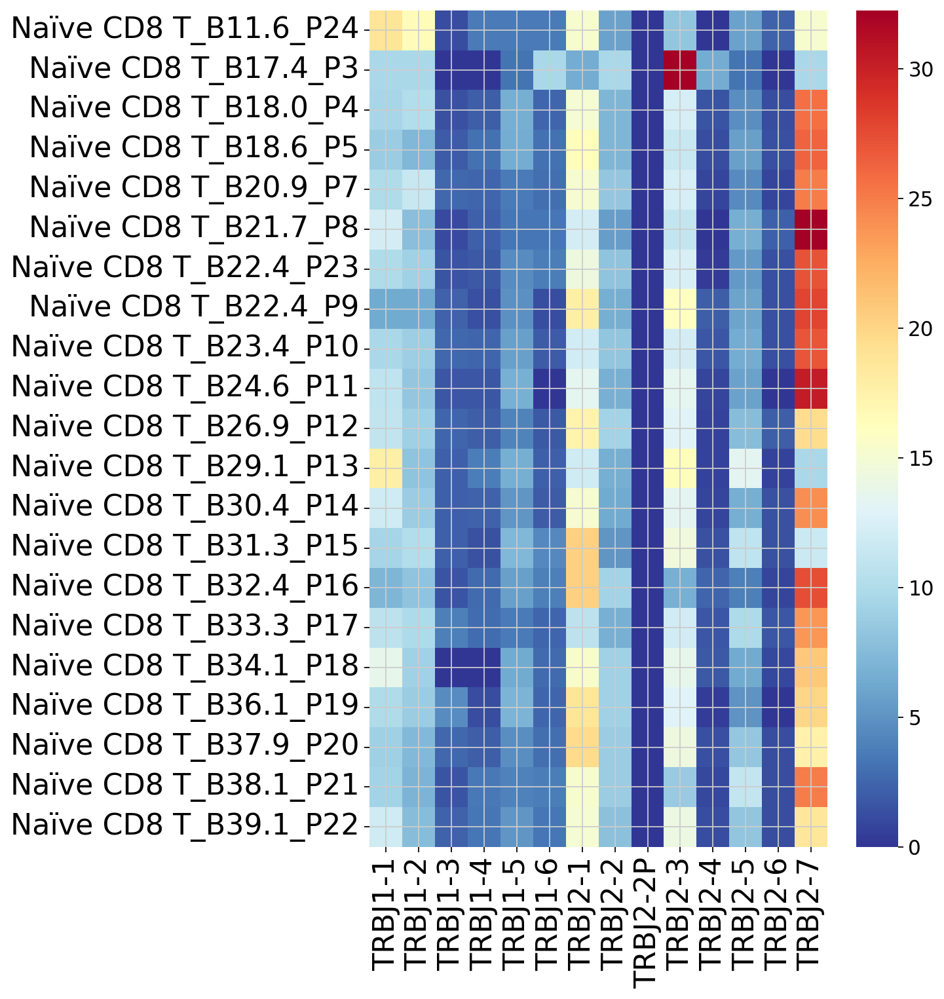

In [21]:
CD8_TRBJ_chain, fig = calculate_TCRVDJ_heatmap(adataPBMC, TRBJIMGT,input_IR='IR_VDJ_1_j_call',input_cell_type='Naïve CD8 T')


/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_script_in_save/TCRutil.py:9: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  selected_adata.obs['Organ_cell_type'] = selected_adata.obs['Last_cell_type'].astype('str') + "_" + selected_adata.obs['AdjustedID'].astype('str')


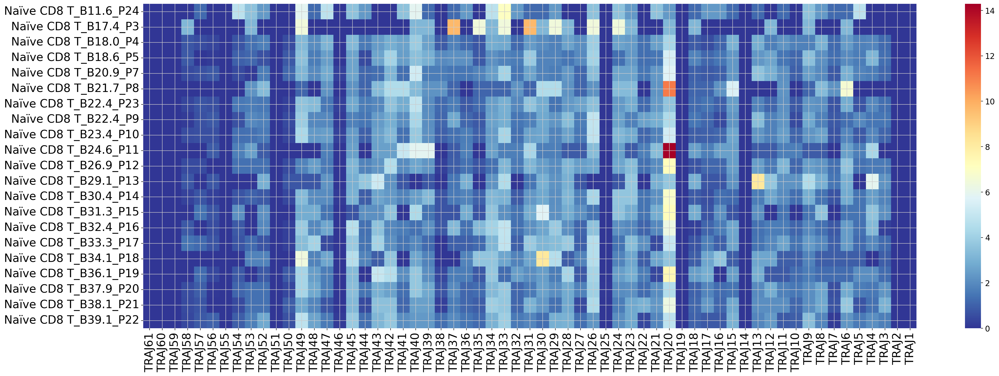

In [22]:
CD4_TRAJ_chain, fig = calculate_TCRVDJ_heatmap(adataPBMC, TRAJIMGT,input_IR='IR_VJ_1_j_call',input_cell_type='Naïve CD8 T')


/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_script_in_save/TCRutil.py:9: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  selected_adata.obs['Organ_cell_type'] = selected_adata.obs['Last_cell_type'].astype('str') + "_" + selected_adata.obs['AdjustedID'].astype('str')


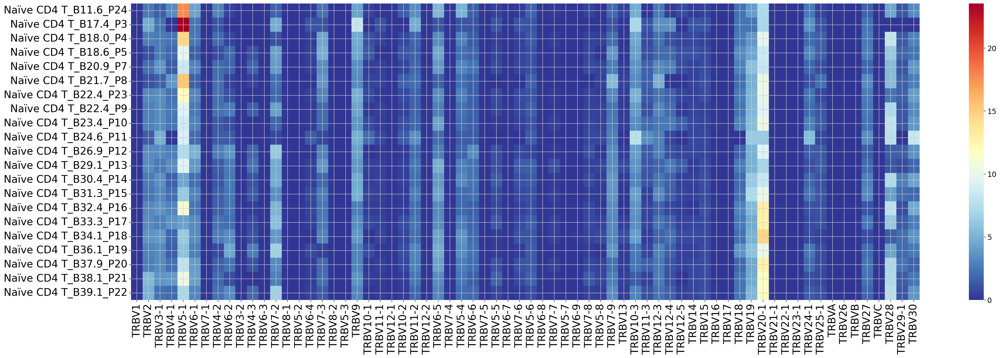

In [23]:
TRB_chain, fig = calculate_TCRVDJ_heatmap(adataPBMC, TRBVlist_values)

In [24]:
# TRA_chain, TRAfig = calculate_TCRVDJ_heatmap(adataPBMC, TRAJlist_values,input_IR='IR_VJ_1_j_call')

/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_script_in_save/TCRutil.py:9: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  selected_adata.obs['Organ_cell_type'] = selected_adata.obs['Last_cell_type'].astype('str') + "_" + selected_adata.obs['AdjustedID'].astype('str')


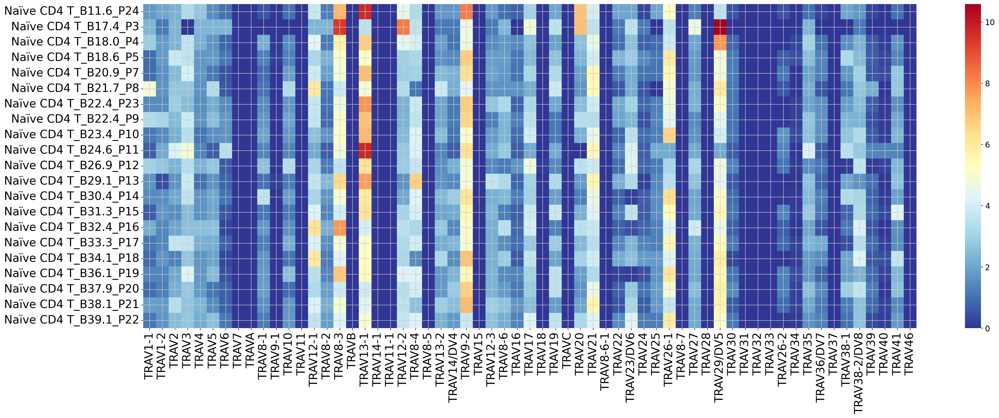

In [25]:
TRA_chain, TRAfig = calculate_TCRVDJ_heatmap(adataPBMC, TRAVlist_values,input_IR='IR_VJ_1_v_call')

In [26]:
CD4TRA=TRA_chain.reset_index().rename(columns={'index': 'Sample'}).melt(id_vars=['Sample'])
CD4TRA

,Sample,variable,value
0,Naïve CD4 T_B11.6_P24,TRAV1-1,1.741294
1,Naïve CD4 T_B17.4_P3,TRAV1-1,2.352941
2,Naïve CD4 T_B18.0_P4,TRAV1-1,2.925532
3,Naïve CD4 T_B18.6_P5,TRAV1-1,0.929512
4,Naïve CD4 T_B20.9_P7,TRAV1-1,0.943396
...,...,...,...
1276,Naïve CD4 T_B34.1_P18,TRAV46,0.0
1277,Naïve CD4 T_B36.1_P19,TRAV46,0.0
1278,Naïve CD4 T_B37.9_P20,TRAV46,0.0
1279,Naïve CD4 T_B38.1_P21,TRAV46,0.0


In [27]:
# TRB_chain

In [28]:
CD4TRB=TRB_chain.reset_index().rename(columns={'index': 'Sample'}).melt(id_vars=['Sample'])
CD4TRB

,Sample,variable,value
0,Naïve CD4 T_B11.6_P24,TRBV1,0.0
1,Naïve CD4 T_B17.4_P3,TRBV1,0.0
2,Naïve CD4 T_B18.0_P4,TRBV1,0.0
3,Naïve CD4 T_B18.6_P5,TRBV1,0.0
4,Naïve CD4 T_B20.9_P7,TRBV1,0.0
...,...,...,...
1423,Naïve CD4 T_B34.1_P18,TRBV30,3.630862
1424,Naïve CD4 T_B36.1_P19,TRBV30,2.561983
1425,Naïve CD4 T_B37.9_P20,TRBV30,1.696284
1426,Naïve CD4 T_B38.1_P21,TRBV30,2.469136


/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:65: UserWarning: Error while trying to convert the column "value". Fall back to string conversion. The error is: <class 'float'>
  warnings.warn('Error while trying to convert '


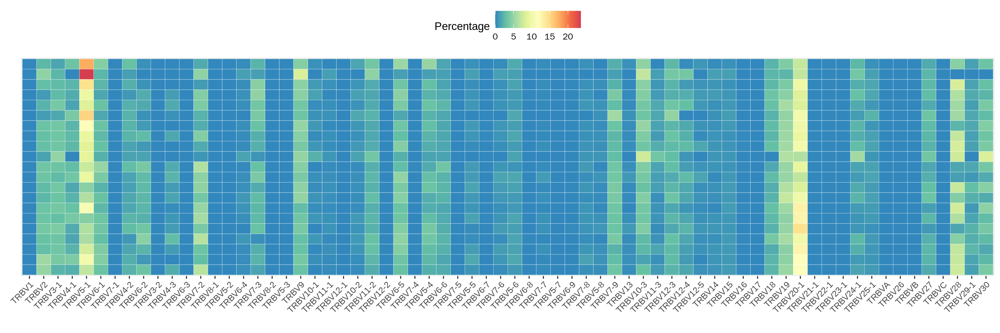

In [29]:
%%R  -w 4200 -h 1400 -r 300 -i CD4TRB -i TRBIMGT_V
library(ggplot2)
library(dplyr)
library(RColorBrewer )
CD4TRB$variable<-factor(CD4TRB$variable,level=TRBIMGT_V$IMGT_gene_name)

library(dplyr)

CD4TRB$Sample<-factor(CD4TRB$Sample,level=rev(sort(unique(CD4TRB$Sample))))
CD4TRB2 <- CD4TRB %>% group_by(variable) %>% filter(sum(as.numeric(value) )!= 0) %>%ungroup()

CD4_TRVBph=ggplot(CD4TRB )+ 

# geom_tile(aes(x=Last_cell_type_num,y= factor(AdjustedID,level=rev(levels(factor(CD45_result$AdjustedID)))),color='white'))+
geom_tile(aes(x=variable,y= Sample,fill=as.numeric(value)),color='white')+
# facet_grid(Body~ Cell_lineage, space = "free", scales = "free", switch = "y")+
 theme(
    axis.text.x = element_text(angle = 45, hjust = 1),
     axis.text.y = element_blank(),
         axis.ticks.y = element_blank(),
     panel.grid.major = element_blank(),
    strip.background = element_blank(),
    strip.placement = "",  # place facet labels outside the plot area
    strip.text.y.left = element_text(angle = 90),legend.position='top') +labs(fill = "Percentage")+

  xlab('') + ylab('')+scale_fill_gradientn(colours = rev(colorRampPalette(brewer.pal(9, "Spectral"))(100)))
# scale_fill_gradientn(colours = rev(colorRampPalette(brewer.pal(9, "Spectral"))(100)))

CD4_TRVBph

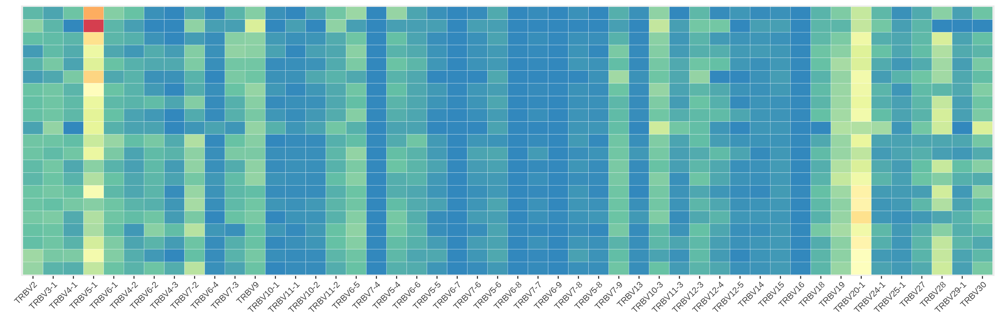

In [30]:
%%R  -w 4200 -h 1400 -r 300 
CD4_TRVBph2=ggplot(CD4TRB2 )+ 

# geom_tile(aes(x=Last_cell_type_num,y= factor(AdjustedID,level=rev(levels(factor(CD45_result$AdjustedID)))),color='white'))+
geom_tile(aes(x=variable,y= Sample,fill=as.numeric(value)),color='white')+
# facet_grid(Body~ Cell_lineage, space = "free", scales = "free", switch = "y")+
 theme(
    axis.text.x = element_text(angle = 45, hjust = 1),
     axis.text.y = element_blank(),
         axis.ticks.y = element_blank(),
     panel.grid.major = element_blank(),
    strip.background = element_blank(),
    strip.placement = "",  # place facet labels outside the plot area
    strip.text.y.left = element_text(angle = 90),legend.position='none') +labs(fill = "Percentage")+

  xlab('') + ylab('')+scale_fill_gradientn(colours = rev(colorRampPalette(brewer.pal(9, "Spectral"))(100)))
# scale_fill_gradientn(colours = rev(colorRampPalette(brewer.pal(9, "Spectral"))(100)))

CD4_TRVBph2

In [32]:
# %%R  -w 8200 -h 1400 -r 300 
# library(aplot)
# CD4_TRVAph %>% insert_right(CD4_TRVBph, width=1)

In [ ]:
# %%R  -w 8200 -h 1400 -r 300 
# library(aplot)
# CD4_TRVAph %>% insert_right(CD4_TRVBph2, width=1)

In [35]:
# %%R  -w 3200 -h 1400 -r 300 
# CD4TRA2 <- CD4TRA %>% group_by(variable) %>% filter(sum(as.numeric(value) )!= 0) %>%ungroup()
# CD4_TRVAph2=ggplot(CD4TRA2 )+ 

# # geom_tile(aes(x=Last_cell_type_num,y= factor(AdjustedID,level=rev(levels(factor(CD45_result$AdjustedID)))),color='white'))+
# geom_tile(aes(x=variable,y= Sample,fill=as.numeric(value)),color='white')+
# # facet_grid(Body~ Cell_lineage, space = "free", scales = "free", switch = "y")+
#  theme(
#     axis.text.x = element_text(angle = 45, hjust = 1),
#      panel.grid.major = element_blank(),
#     strip.background = element_blank(),
#     strip.placement = "",  # place facet labels outside the plot area
#     strip.text.y.left = element_text(angle = 90),legend.position='none') +labs(fill = "Percentage")+

#   xlab('') + ylab('')+scale_fill_gradientn(colours = rev(colorRampPalette(brewer.pal(9, "Spectral"))(100)))+ scale_y_discrete(labels = function(x) sub("^[^_]*_", "", x))+xlab('')
# # scale_fill_gradientn(colours = rev(colorRampPalette(brewer.pal(9, "Spectral"))(100)))
# CD4_TRVAph2

In [36]:
# %%R  -w 9000 -h 2200 -r 550 
# library(aplot)
# CD4_TRVAph3=CD4_TRVAph2 +ggtitle('TRAV')
# CD4_TRBVph3=CD4_TRVBph2+ggtitle('TRBV')
# CD4TRV=CD4_TRVAph3%>% insert_right(CD4_TRBVph3, width=1)

# ggsave(plot=CD4TRV,'/data5/maolp/Gaofeng_All_matrix/Allcount/Last_All_scanpyData/TCRFigure/CD4TRV.pdf',height=6,width=27)
# CD4TRV

/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_script_in_save/TCRutil.py:9: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  selected_adata.obs['Organ_cell_type'] = selected_adata.obs['Last_cell_type'].astype('str') + "_" + selected_adata.obs['AdjustedID'].astype('str')


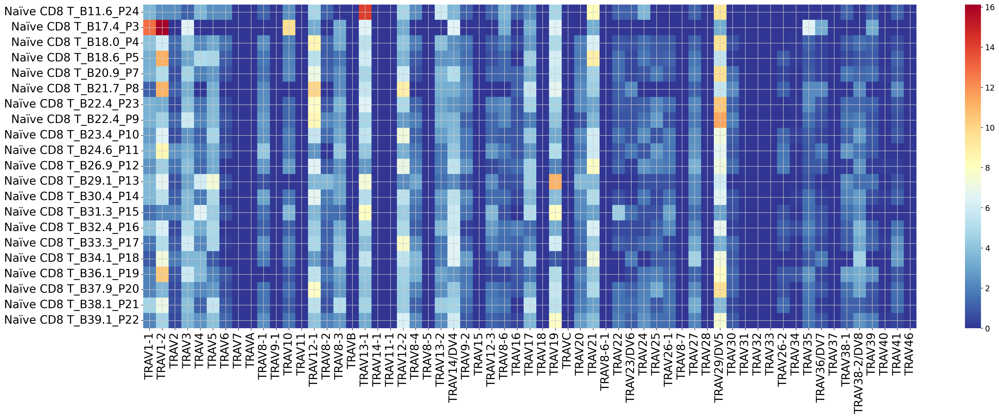

In [37]:
CD8TRA_chain, TRAfig = calculate_TCRVDJ_heatmap(adataPBMC, TRAVlist_values,input_IR='IR_VJ_1_v_call',input_cell_type='Naïve CD8 T')


In [38]:
CD8TRA=CD8TRA_chain.reset_index().rename(columns={'index': 'Sample'}).melt(id_vars=['Sample'])
CD8TRA

,Sample,variable,value
0,Naïve CD8 T_B11.6_P24,TRAV1-1,3.529412
1,Naïve CD8 T_B17.4_P3,TRAV1-1,12.903226
2,Naïve CD8 T_B18.0_P4,TRAV1-1,4.030227
3,Naïve CD8 T_B18.6_P5,TRAV1-1,3.30033
4,Naïve CD8 T_B20.9_P7,TRAV1-1,3.453947
...,...,...,...
1276,Naïve CD8 T_B34.1_P18,TRAV46,0.0
1277,Naïve CD8 T_B36.1_P19,TRAV46,0.0
1278,Naïve CD8 T_B37.9_P20,TRAV46,0.0
1279,Naïve CD8 T_B38.1_P21,TRAV46,0.0


/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:65: UserWarning: Error while trying to convert the column "value". Fall back to string conversion. The error is: <class 'float'>
  warnings.warn('Error while trying to convert '


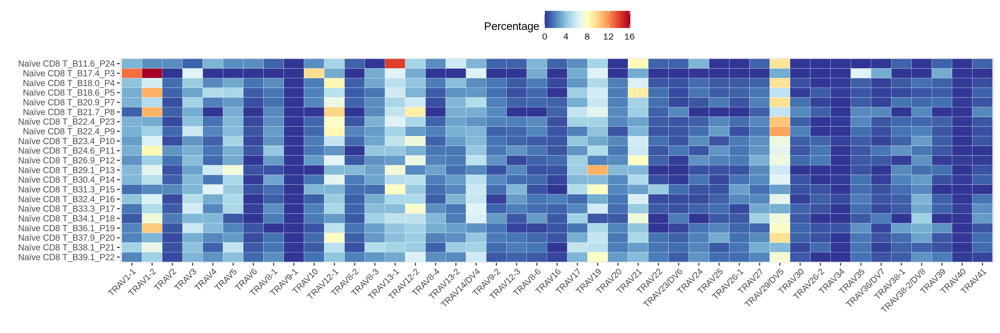

In [39]:
%%R  -w 4200 -h 1400 -r 300 -i CD8TRA -i TRAIMGT_V
library(ggplot2)
library(dplyr)
library(RColorBrewer )
CD8TRA$variable<-factor(CD8TRA$variable,level=TRAIMGT_V$IMGT_gene_name)
# 加载必要的库
library(dplyr)

# 假设你的数据框叫做 df

CD8TRA$Sample<-factor(CD8TRA$Sample,level=rev(sort(unique(CD8TRA$Sample))))
CD8TRA2 <- CD8TRA %>% group_by(variable) %>% filter(sum(as.numeric(value) )!= 0) %>%ungroup()
# CD8TRA<-
CD8_TRVAph=ggplot(CD8TRA2 )+ 

# geom_tile(aes(x=Last_cell_type_num,y= factor(AdjustedID,level=rev(levels(factor(CD45_result$AdjustedID)))),color='white'))+
geom_tile(aes(x=variable,y= Sample,fill=as.numeric(value)),color='white')+
# facet_grid(Body~ Cell_lineage, space = "free", scales = "free", switch = "y")+
 theme(
    axis.text.x = element_text(angle = 45, hjust = 1),
#      axis.text.y = element_blank(),
#          axis.ticks.y = element_blank(),
     panel.grid.major = element_blank(),
    strip.background = element_blank(),
    strip.placement = "",  # place facet labels outside the plot area
    strip.text.y.left = element_text(angle = 90),legend.position='top') +labs(fill = "Percentage")+

   xlab('') + ylab('')+scale_fill_gradientn(colours = rev(colorRampPalette(brewer.pal(11, "RdYlBu"))(100)))
# scale_fill_gradientn(colours = rev(colorRampPalette(brewer.pal(9, "Spectral"))(100)))

CD8_TRVAph

/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_script_in_save/TCRutil.py:9: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  selected_adata.obs['Organ_cell_type'] = selected_adata.obs['Last_cell_type'].astype('str') + "_" + selected_adata.obs['AdjustedID'].astype('str')


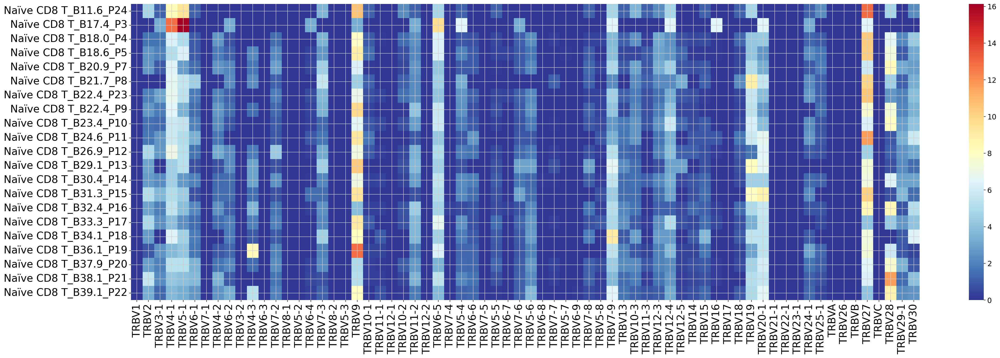

In [40]:
CD8TRB_chain, TRBfig = calculate_TCRVDJ_heatmap(adataPBMC, TRBVlist_values,input_IR='IR_VDJ_1_v_call',input_cell_type='Naïve CD8 T')


In [41]:
CD8TRB=CD8TRB_chain.reset_index().rename(columns={'index': 'Sample'}).melt(id_vars=['Sample'])
CD8TRB

,Sample,variable,value
0,Naïve CD8 T_B11.6_P24,TRBV1,0.0
1,Naïve CD8 T_B17.4_P3,TRBV1,0.0
2,Naïve CD8 T_B18.0_P4,TRBV1,0.0
3,Naïve CD8 T_B18.6_P5,TRBV1,0.0
4,Naïve CD8 T_B20.9_P7,TRBV1,0.0
...,...,...,...
1423,Naïve CD8 T_B34.1_P18,TRBV30,6.363636
1424,Naïve CD8 T_B36.1_P19,TRBV30,0.414938
1425,Naïve CD8 T_B37.9_P20,TRBV30,0.869565
1426,Naïve CD8 T_B38.1_P21,TRBV30,3.944316


/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:65: UserWarning: Error while trying to convert the column "value". Fall back to string conversion. The error is: <class 'float'>
  warnings.warn('Error while trying to convert '


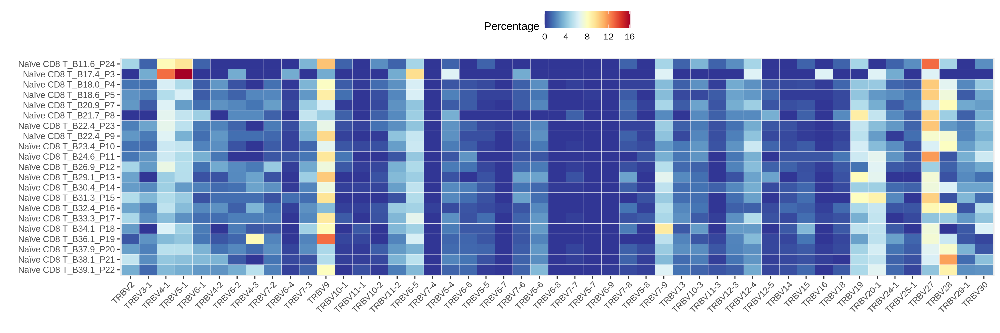

In [42]:
%%R  -w 4200 -h 1400 -r 300 -i CD8TRB -i TRBIMGT_V
library(ggplot2)
library(dplyr)
library(RColorBrewer )

CD8TRB$variable<-factor(CD8TRB$variable,level=TRBIMGT_V$IMGT_gene_name)


CD8TRB$Sample<-factor(CD8TRB$Sample,level=rev(sort(unique(CD8TRB$Sample))))
CD8TRB2 <- CD8TRB %>% group_by(variable) %>% filter(sum(as.numeric(value) )!= 0) %>%ungroup()

# CD8TRB<-
CD8_TRVBph=ggplot(CD8TRB2 )+ 

# geom_tile(aes(x=Last_cell_type_num,y= factor(AdjustedID,level=rev(levels(factor(CD45_result$AdjustedID)))),color='white'))+
geom_tile(aes(x=variable,y= Sample,fill=as.numeric(value)),color='white')+
# facet_grid(Body~ Cell_lineage, space = "free", scales = "free", switch = "y")+
 theme(
    axis.text.x = element_text(angle = 45, hjust = 1),
#      axis.text.y = element_blank(),
#          axis.ticks.y = element_blank(),
     panel.grid.major = element_blank(),
    strip.background = element_blank(),
    strip.placement = "",  # place facet labels outside the plot area
    strip.text.y.left = element_text(angle = 90),legend.position='top') +labs(fill = "Percentage")+
  xlab('') + ylab('')+scale_fill_gradientn(colours = rev(colorRampPalette(brewer.pal(11, "RdYlBu"))(100)))


CD8_TRVBph

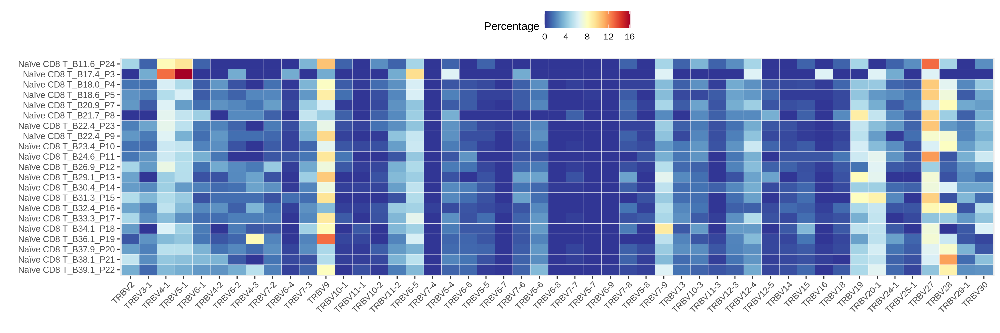

In [43]:
%%R  -w 4200 -h 1400 -r 300 -i CD8TRB -i TRBIMGT_V
library(ggplot2)
library(dplyr)
library(RColorBrewer )

CD8TRB$variable<-factor(CD8TRB$variable,level=TRBIMGT_V$IMGT_gene_name)


CD8TRB$Sample<-factor(CD8TRB$Sample,level=rev(sort(unique(CD8TRB$Sample))))
CD8TRB2 <- CD8TRB %>% group_by(variable) %>% filter(sum(as.numeric(value) )!= 0) %>%ungroup()

# CD8TRB<-
CD8_TRVBph=ggplot(CD8TRB2 )+ 

# geom_tile(aes(x=Last_cell_type_num,y= factor(AdjustedID,level=rev(levels(factor(CD45_result$AdjustedID)))),color='white'))+
geom_tile(aes(x=variable,y= Sample,fill=as.numeric(value)),color='white')+
# facet_grid(Body~ Cell_lineage, space = "free", scales = "free", switch = "y")+
 theme(
    axis.text.x = element_text(angle = 45, hjust = 1),
#      axis.text.y = element_blank(),
#          axis.ticks.y = element_blank(),
     panel.grid.major = element_blank(),
    strip.background = element_blank(),
    strip.placement = "",  # place facet labels outside the plot area
    strip.text.y.left = element_text(angle = 90),legend.position='top') +labs(fill = "Percentage")+

   xlab('') + ylab('')+scale_fill_gradientn(colours = rev(colorRampPalette(brewer.pal(11, "RdYlBu"))(100)))
# scale_fill_gradientn(colours = rev(colorRampPalette(brewer.pal(9, "SpecTRBl"))(100)))

CD8_TRVBph

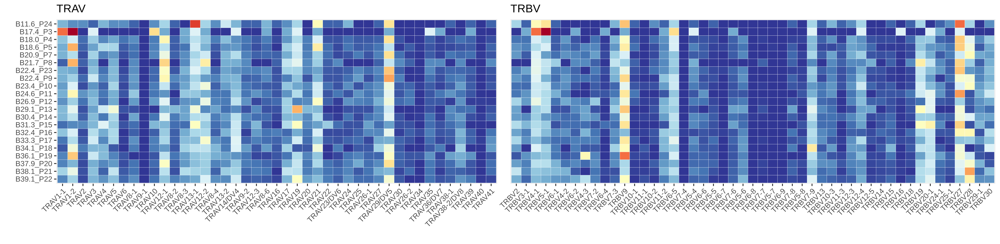

In [44]:
%%R  -w 9000 -h 2200 -r 550 
library(aplot)
CD8TRAV2=CD8_TRVAph+theme(legend.position='none')+ scale_y_discrete(labels = function(x) sub("^[^_]*_", "", x))+xlab('')+ggtitle('TRAV')
CD8TRBV2=CD8_TRVBph+theme(axis.text.y = element_blank(),
         axis.ticks.y = element_blank(),legend.position='none')+ggtitle('TRBV')
CD8TRV= CD8TRAV2%>% insert_right(CD8TRBV2, width=1.1)

ggsave(plot=CD8TRV,'/data5/maolp/Gaofeng_All_matrix/Allcount/Last_All_scanpyData/TCRFigure/CD8TRV.pdf',height=6,width=27)
CD8TRV

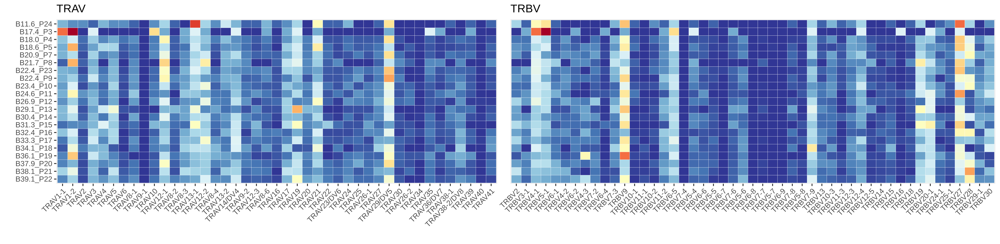

In [45]:
%%R  -w 9000 -h 2200 -r 550 
CD8TRV 

In [46]:
# %%R  -w 9000 -h 4200 -r 550 
# # CD8TRV %>% insert_top(CD4TRV, height=1)  
# CD8TRAV2 %>% insert_left(CD8TRAV2, width=1) %>% 
#   insert_top(CD8TRAV2, height=1)  
# #   insert_top(CD8TRAV2, width=1) 


In [47]:
%%R -i TRB_chain
library(reshape)
library(tidyverse)
TRB_chian2 <- TRB_chain %>% rownames_to_column(var = "Sample") 
TRB_chian2ratio <- melt(TRB_chian2, id = c("Sample"))
head(TRB_chian2ratio )

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:65: UserWarning: Error while trying to convert the column "TRBV1". Fall back to string conversion. The error is: <class 'float'>
  warnings.warn('Error while trying to convert '
/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:65: UserWarning: Error while trying to convert the column "TRBV2". Fall back to string conversion. The error is: <class 'float'>
  warnings.warn('Error while trying to convert '
/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:65: UserWarning: Error while trying to convert the column "TRBV3-1". Fall back to string conversion. The error is: <class 'float'>
  warnings.warn('Error while trying to convert '
/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:65: UserWarning: Error while trying to convert the column "TRBV4-1". Fall back to string conversion. The error is: <clas

                 Sample variable value
1 Naïve CD4 T_B11.6_P24    TRBV1   0.0
2  Naïve CD4 T_B17.4_P3    TRBV1   0.0
3  Naïve CD4 T_B18.0_P4    TRBV1   0.0
4  Naïve CD4 T_B18.6_P5    TRBV1   0.0
5  Naïve CD4 T_B20.9_P7    TRBV1   0.0
6  Naïve CD4 T_B21.7_P8    TRBV1   0.0


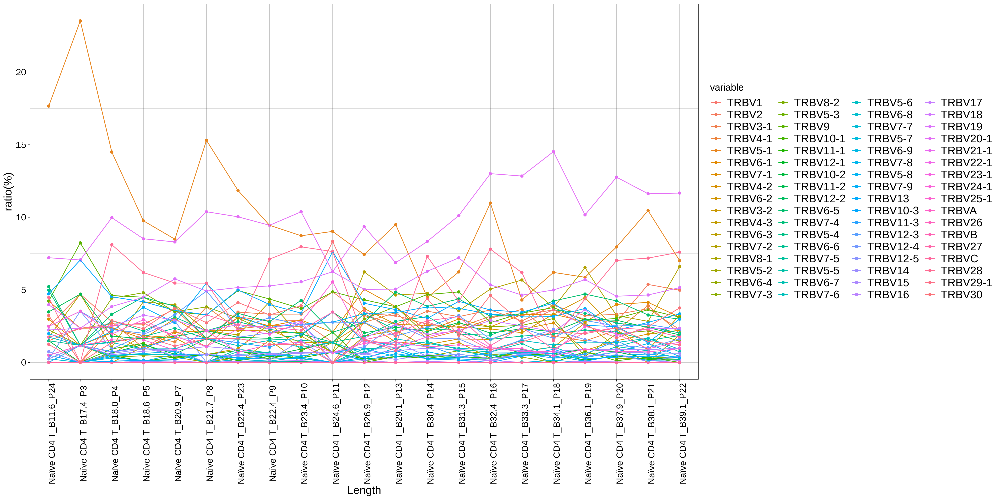

In [48]:
%%R -w 6000 -h 3000 -r 300
  p <- ggplot(TRB_chian2ratio) +
    geom_point(aes(Sample, as.numeric(value), color = variable)) +
    geom_line(aes(Sample, as.numeric(value), color = variable, group = variable)) +
#     ggtitle(plot_title) +
    theme_linedraw() +
    xlab('Length') +
    ylab('ratio(%)') +
    theme(plot.title = element_text(hjust = 0.5, size = 13, face = "bold"))+ theme(text = element_text(size = 16),
          legend.position = "right",
          legend.title = element_text(size = 14),
          legend.text = element_text(size = 16),
          axis.text.x=element_text(angle=90),
      ) 
p

In [49]:
# dfPBMCratio=df_ratio[[col for col in df_ratio.columns if 'B' in col]]
# dfPBMCratio
from scipy.stats import spearmanr

week = list(range(1, len(TRB_chain.index) + 1))

TRBVsper = TRB_chain.T.copy()
r_values = []
p_values = []

for index, row in TRB_chain.T.iterrows():
#     print(index,row)
    r_value, p_value = spearmanr(row, week)
    r_values.append(r_value)
    p_values.append(p_value)


TRBVsper['r_value_with_week'] = r_values
TRBVsper['p_value_with_week'] = p_values

/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/scipy/stats/_stats_py.py:4916: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


In [50]:

TRBVsig=TRBVsper[TRBVsper.p_value_with_week<0.05]
TRBVsig

,Naïve CD4 T_B11.6_P24,Naïve CD4 T_B17.4_P3,Naïve CD4 T_B18.0_P4,Naïve CD4 T_B18.6_P5,Naïve CD4 T_B20.9_P7,Naïve CD4 T_B21.7_P8,Naïve CD4 T_B22.4_P23,Naïve CD4 T_B22.4_P9,Naïve CD4 T_B23.4_P10,Naïve CD4 T_B24.6_P11,...,Naïve CD4 T_B31.3_P15,Naïve CD4 T_B32.4_P16,Naïve CD4 T_B33.3_P17,Naïve CD4 T_B34.1_P18,Naïve CD4 T_B36.1_P19,Naïve CD4 T_B37.9_P20,Naïve CD4 T_B38.1_P21,Naïve CD4 T_B39.1_P22,r_value_with_week,p_value_with_week
TRBV2,2.487562,4.705882,2.792553,1.006971,2.169811,1.092896,3.137903,2.849003,2.887972,1.388889,...,2.42915,3.179191,3.226891,3.630862,2.975207,2.786753,5.374001,4.975124,0.480519,0.027463
TRBV5-1,17.661692,23.529412,14.494681,9.759876,8.490566,15.300546,11.849711,9.449193,8.727388,9.027778,...,6.234818,10.982659,4.302521,6.202723,5.867769,7.956381,10.457516,7.010403,-0.662338,0.001071
TRBV6-2,0.497512,0.0,0.576241,1.859024,1.698113,0.546448,0.949628,2.659069,0.888607,1.388889,...,2.42915,2.312139,2.05042,3.32829,4.46281,2.261712,0.87146,3.256445,0.620779,0.002674
TRBV7-2,1.741294,4.705882,1.06383,4.182804,3.962264,2.185792,1.899257,4.178538,1.80895,0.694444,...,3.562753,5.057803,5.680672,3.782148,6.528926,3.231018,2.832244,6.603347,0.435065,0.048714
TRBV9,4.228856,8.235294,4.609929,4.492641,3.490566,3.278689,4.954583,4.368471,3.713107,4.861111,...,4.8583,2.745665,3.394958,3.782148,2.892562,3.029079,3.631082,3.12076,-0.551948,0.009482
TRBV10-3,4.726368,7.058824,4.521277,4.182804,3.584906,3.278689,4.995871,3.988604,3.395747,7.638889,...,4.210526,3.612717,3.462185,4.08472,2.561983,2.463651,1.379811,2.985075,-0.666234,0.000976
TRBV20-1,7.21393,7.058824,9.973404,8.520527,8.301887,10.382514,10.033031,9.449193,10.377658,6.25,...,10.121457,13.00578,12.840336,14.523449,10.165289,12.76252,11.619463,11.668928,0.648052,0.001489
TRBV24-1,2.487562,3.529412,1.950355,2.943455,1.792453,1.092896,2.312139,1.946819,2.761028,5.555556,...,2.267206,1.011561,0.739496,0.75643,2.479339,1.978998,0.944081,1.402081,-0.525974,0.014322


In [51]:
# %%R -w 2600 -h 1500 -r 300 -i TRBVsig
# library(data.table)
# library(ggsci)
# TRBVdata=fread('/data5/maolp/Gaofeng_All_matrix/Allcount/All_scanpyData/TCRFigure/TRBV_PBMC_chain_ratio.csv') %>% as.data.frame()

# rownames(TRBVdata)<-TRBVdata$V1
# TRBVdata<-TRBVdata[,-1]
# # TRB_chain<- as.numeric(TRB_chain)
# # colSums
# TRB_chain3<-TRBVdata[,rownames(TRBVsig)]
# TRB_chain3
# TRB_chian4 <- TRB_chain3 %>% rownames_to_column(var = "Sample") 
# TRB_chian4ratio <- melt(TRB_chian4, id = c("Sample"))
# TRB_chian4ratio 
#   p <- ggplot(TRB_chian4ratio) +
#     geom_point(aes(Sample, as.numeric(value), color = variable)) +
# #     geom_line(aes(Sample, as.numeric(value), color = variable, group = variable)) +
# geom_smooth(aes(Sample, as.numeric(value), color = variable, group = variable),se=F) +
# #     ggtitle(plot_title) +
#     theme_linedraw() +
#     xlab('') +
#     ylab('ratio(%)') +labs(color = "TRBV")+
#     theme(plot.title = element_text(hjust = 0.5, size = 13, face = "bold"))+ theme(text = element_text(size = 16),
#           legend.position = "right",
#           legend.title = element_text(size = 14),
#           legend.text = element_text(size = 12),
#           axis.text.x=element_text(angle=90),
#       ) +scale_color_lancet()+ scale_x_discrete(labels = function(x) sub("^[^_]*_", "", x))+
#                                                 xlab('')+ggtitle('Naive CD4 T')
# p

In [52]:
adata_noT12=adata[~adata.obs['AdjustedID'].str.contains('T10.1_P25')]
adata_noT12.obs.AdjustedID.unique()

['B17.4_P3', 'B23.4_P10', 'B39.1_P22', 'T18.6_P5', 'B18.6_P5', ..., 'L18.6_P5', 'B33.3_P17', 'S24.6_P11', 'B38.1_P21', 'B22.4_P23']
Length: 29
Categories (29, object): ['B11.6_P24' < 'B17.4_P3' < 'B18.0_P4' < 'B18.6_P5' ... 'T18.6_P5' < 'T24.6_P11' < 'S18.6_P5' < 'S24.6_P11']

In [53]:
# ls

/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_script_in_save/TCRutil.py:50: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  selected_adata.obs['Organ_cell_type'] = selected_adata.obs['Last_cell_type'].astype('str') + "_" + selected_adata.obs['AdjustedID'].astype('str')


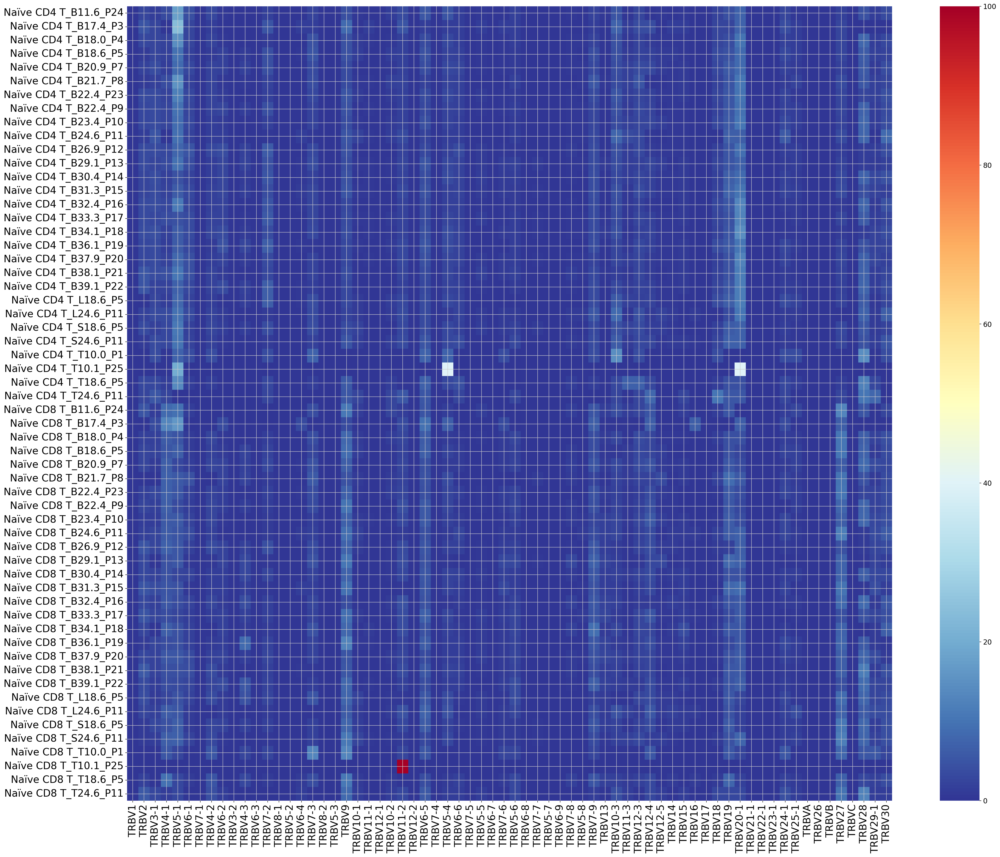

In [54]:
CD48TCR_chain, BCRHfig = calculate_TCRVDJ_heatmap2(adata,TRBVlist_values ,input_IR='IR_VDJ_1_v_call',input_cell_type=['Naïve CD4 T','Naïve CD8 T'])

/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_script_in_save/TCRutil.py:50: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  selected_adata.obs['Organ_cell_type'] = selected_adata.obs['Last_cell_type'].astype('str') + "_" + selected_adata.obs['AdjustedID'].astype('str')


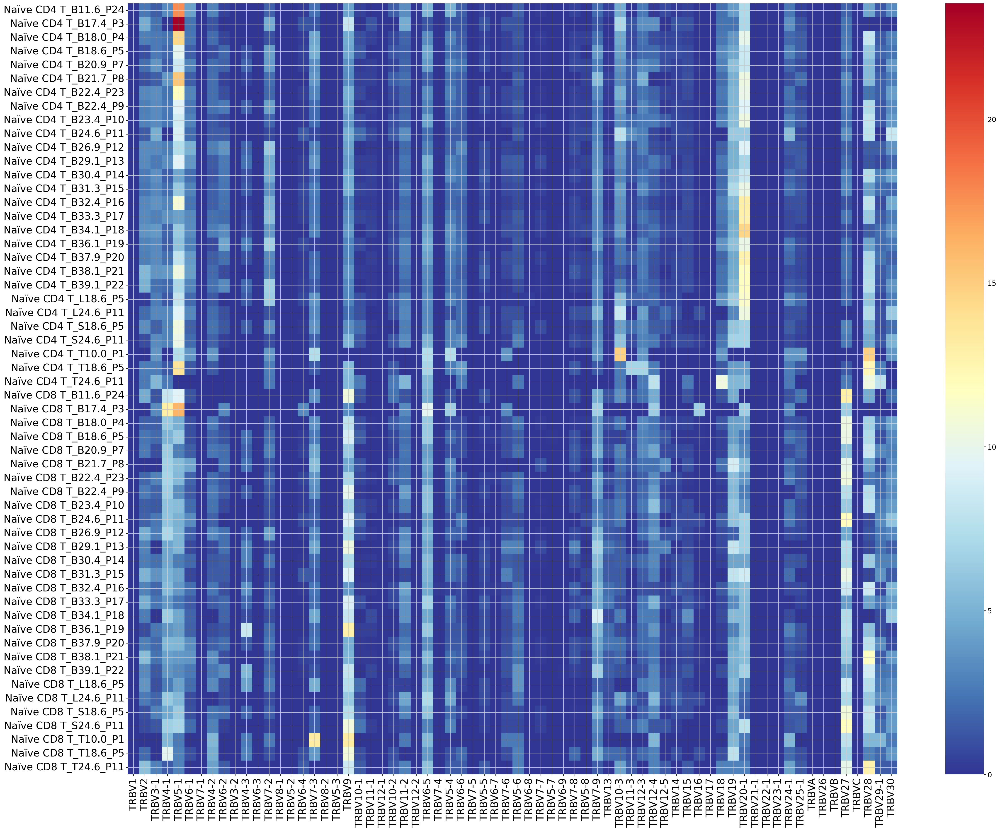

In [55]:
CD48TCR_chain, BCRHfig = calculate_TCRVDJ_heatmap2(adata_noT12,TRBVlist_values ,input_IR='IR_VDJ_1_v_call',input_cell_type=['Naïve CD4 T','Naïve CD8 T'])

In [56]:
# adata_select=adata
# v_call_B_VDJ_main_list = list(adata_select.obs['v_call_B_VDJ_main'].cat.categories)
# d_call_B_VDJ_main_list = list(adata_select.obs['d_call_B_VDJ_main'].cat.categories)
# j_call_B_VDJ_main_list = list(adata_select.obs['j_call_B_VDJ_main'].cat.categories)
# v_call_B_VJ_main_list = list(adata_select.obs['v_call_B_VJ_main'].cat.categories)
# j_call_B_VJ_main_list = list(adata_select.obs['j_call_B_VJ_main'].cat.categories)

# TCR_list = v_call_B_VJ_main_list+j_call_B_VJ_main_list+v_call_B_VDJ_main_list +d_call_B_VDJ_main_list +j_call_B_VDJ_main_list 

/tmp/ipykernel_70588/3438985166.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_select.obs['Organ_cell_type']=adata_select.obs['Last_cell_type'].astype('str')+"_"+adata_select.obs['AdjustedID'].astype('str')


[Text(0, 0.5, 'Naïve CD4 T_B11.6_P24'),
 Text(0, 1.5, 'Naïve CD4 T_B17.4_P3'),
 Text(0, 2.5, 'Naïve CD4 T_B18.0_P4'),
 Text(0, 3.5, 'Naïve CD4 T_B18.6_P5'),
 Text(0, 4.5, 'Naïve CD4 T_B20.9_P7'),
 Text(0, 5.5, 'Naïve CD4 T_B21.7_P8'),
 Text(0, 6.5, 'Naïve CD4 T_B22.4_P23'),
 Text(0, 7.5, 'Naïve CD4 T_B22.4_P9'),
 Text(0, 8.5, 'Naïve CD4 T_B23.4_P10'),
 Text(0, 9.5, 'Naïve CD4 T_B24.6_P11'),
 Text(0, 10.5, 'Naïve CD4 T_B26.9_P12'),
 Text(0, 11.5, 'Naïve CD4 T_B29.1_P13'),
 Text(0, 12.5, 'Naïve CD4 T_B30.4_P14'),
 Text(0, 13.5, 'Naïve CD4 T_B31.3_P15'),
 Text(0, 14.5, 'Naïve CD4 T_B32.4_P16'),
 Text(0, 15.5, 'Naïve CD4 T_B33.3_P17'),
 Text(0, 16.5, 'Naïve CD4 T_B34.1_P18'),
 Text(0, 17.5, 'Naïve CD4 T_B36.1_P19'),
 Text(0, 18.5, 'Naïve CD4 T_B37.9_P20'),
 Text(0, 19.5, 'Naïve CD4 T_B38.1_P21'),
 Text(0, 20.5, 'Naïve CD4 T_B39.1_P22'),
 Text(0, 21.5, 'Naïve CD4 T_L18.6_P5'),
 Text(0, 22.5, 'Naïve CD4 T_L24.6_P11'),
 Text(0, 23.5, 'Naïve CD4 T_S18.6_P5'),
 Text(0, 24.5, 'Naïve CD4 T_S24.6_

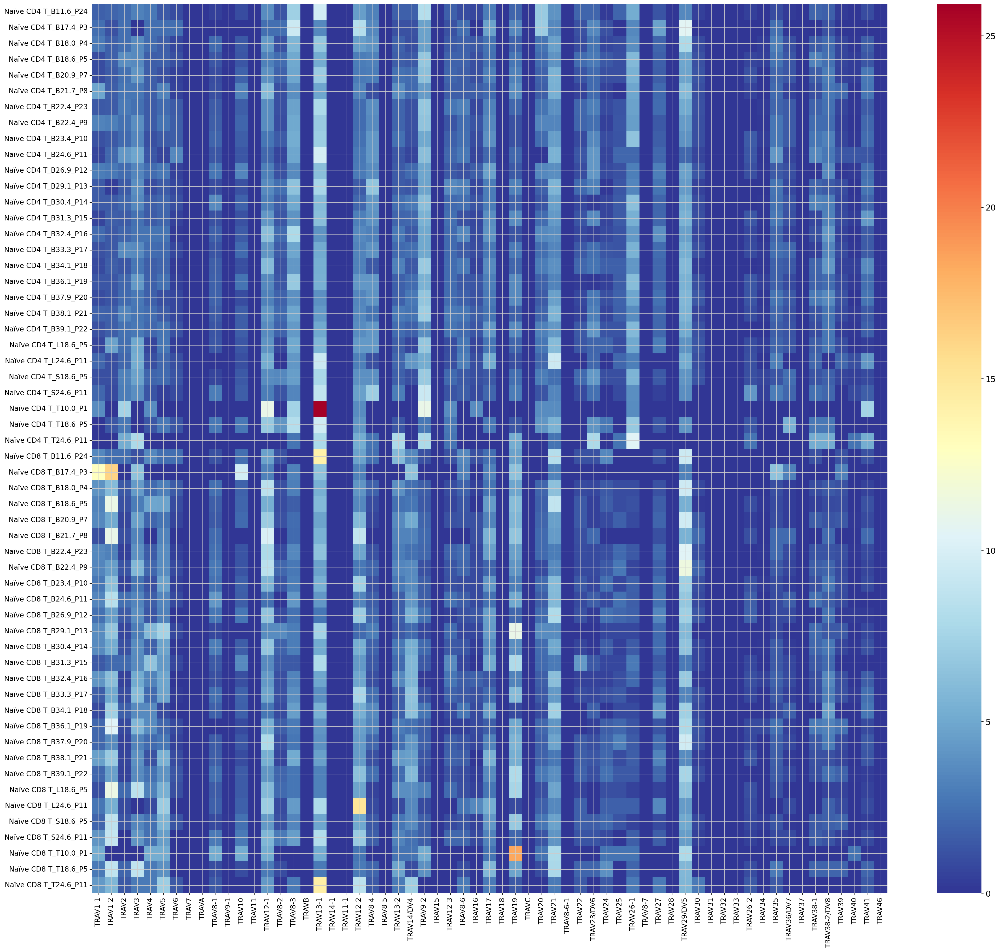

In [57]:

adata_select=adata[adata.obs['Last_cell_type'].isin(['Naïve CD4 T','Naïve CD8 T'])]
adata_select = adata_select[~adata_select.obs['AdjustedID'].str.startswith('T10.1_P25')]

adata_select.obs['Organ_cell_type']=adata_select.obs['Last_cell_type'].astype('str')+"_"+adata_select.obs['AdjustedID'].astype('str')

from collections import Counter
CD48TCRA_chain = None
ct_select=sorted(adata_select.obs['Organ_cell_type'].unique())
Dict = {'IR_VJ_1_v_call':TRAVlist_values}

for name in list(Dict.keys()):
    df = pd.DataFrame(columns = Dict[name],  index = ct_select)
    
    for cell in df.index:
#         print(cell)
        counter = Counter(adata_select.obs.loc[adata_select.obs['Organ_cell_type']==cell,name])
#         print(counter)
        for chain_type in df.columns:
            df.loc[cell, chain_type]=counter[chain_type]
        
        df.loc[cell,:] = df.loc[cell,:] / np.sum(df.loc[cell,:]) * 100
    
    if CD48TCRA_chain is None:
        CD48TCRA_chain = df.copy()
    else:
        CD48TCRA_chain = pd.concat([CD48TCRA_chain, df], axis=1)
fig, ax = plt.subplots(figsize=(CD48TCRA_chain.shape[1]/2,CD48TCRA_chain.shape[0]/2))
#sb.set_theme()
uniform_data = CD48TCRA_chain
uniform_data=uniform_data.astype('float')
ax = sb.heatmap(uniform_data,cmap='RdYlBu_r', yticklabels=True)
_, xlabels = plt.xticks()
_, ylabels = plt.yticks()
ax.set_xticklabels(xlabels, size=12,rotation=90)
ax.set_yticklabels(ylabels, size=12,rotation=0)


/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_script_in_save/TCRutil.py:50: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  selected_adata.obs['Organ_cell_type'] = selected_adata.obs['Last_cell_type'].astype('str') + "_" + selected_adata.obs['AdjustedID'].astype('str')


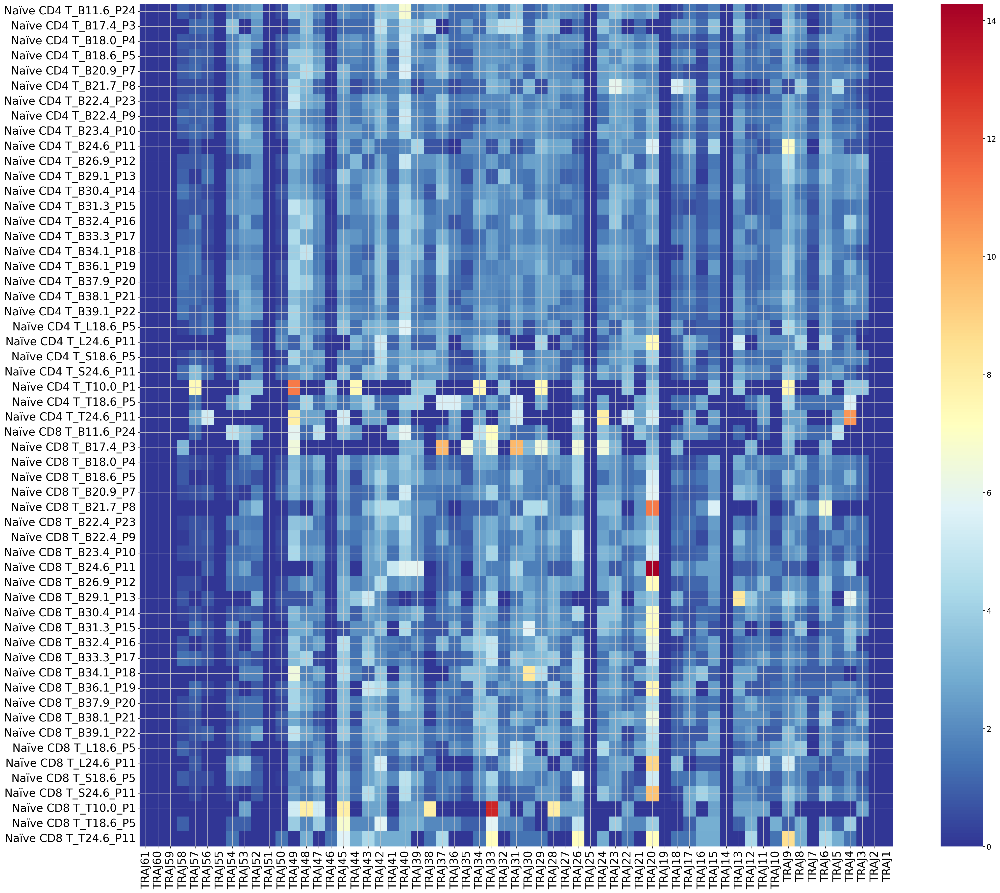

In [58]:
CD48TCRAJ_chain, BCRJfig = calculate_TCRVDJ_heatmap2(adata_noT12,TRAJIMGT,input_IR='IR_VJ_1_j_call',input_cell_type=['Naïve CD4 T','Naïve CD8 T'])

In [59]:
# TRBJIMGT

/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_script_in_save/TCRutil.py:50: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  selected_adata.obs['Organ_cell_type'] = selected_adata.obs['Last_cell_type'].astype('str') + "_" + selected_adata.obs['AdjustedID'].astype('str')


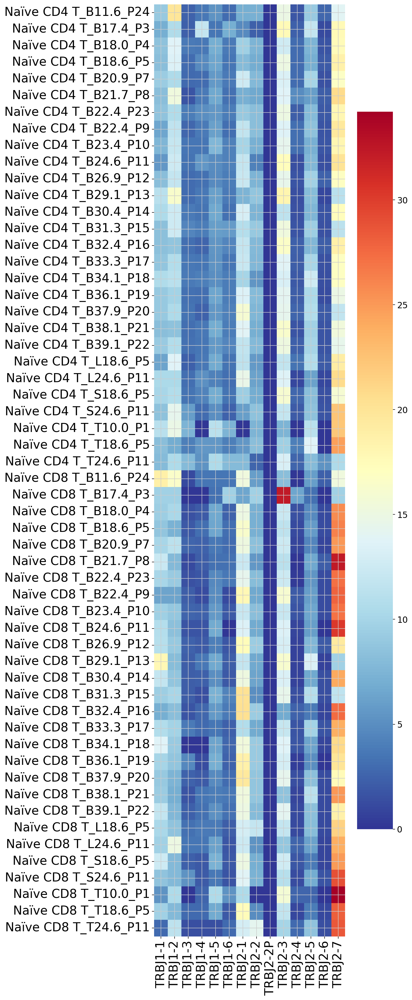

In [60]:
CD48TCRBJ_chain, BCRJfig = calculate_TCRVDJ_heatmap2(adata_noT12,TRBJIMGT,input_IR='IR_VDJ_1_j_call',input_cell_type=['Naïve CD4 T','Naïve CD8 T'])

In [69]:
# CD48TCRA_chain, BCRHfig = calculate_TCRVDJ_heatmap2(adata_noT12,TRBVlist_values,input_IR='IR_VJ_1_v_call',input_cell_type=['Naïve CD4 T','Naïve CD8 T'])

/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_script_in_save/TCRutil.py:50: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  selected_adata.obs['Organ_cell_type'] = selected_adata.obs['Last_cell_type'].astype('str') + "_" + selected_adata.obs['AdjustedID'].astype('str')


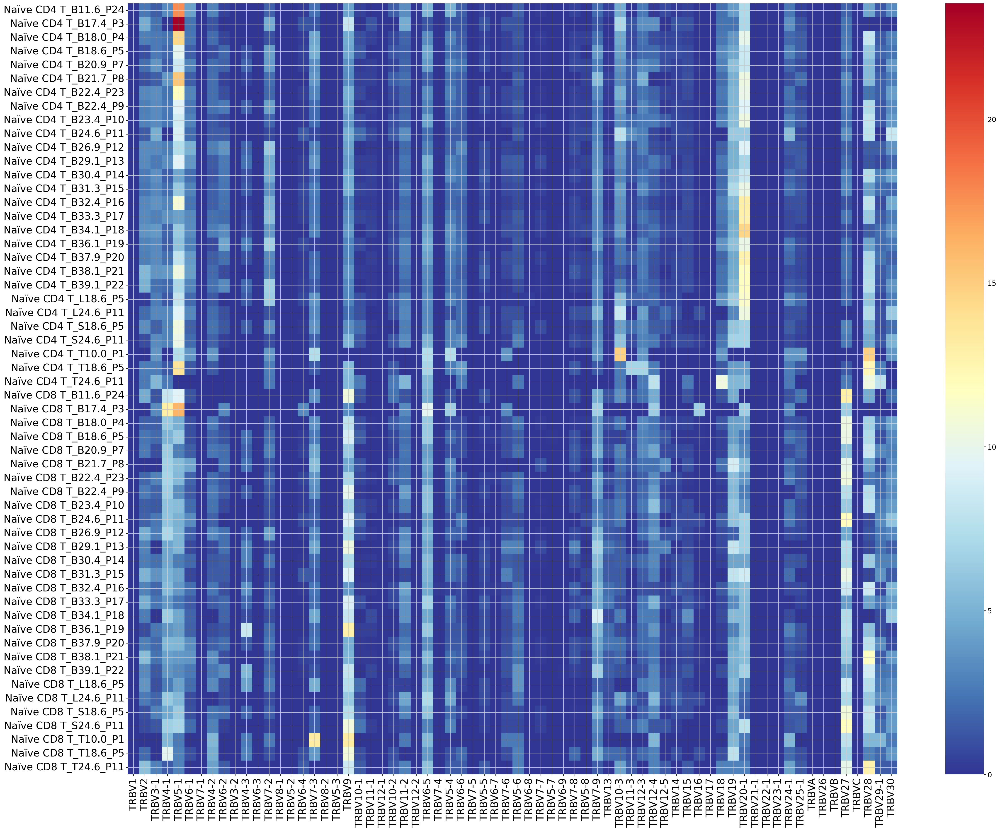

In [62]:
CD48TCR_chain, BCRHfig = calculate_TCRVDJ_heatmap2(adata_noT12,TRBVlist_values ,input_IR='IR_VDJ_1_v_call',input_cell_type=['Naïve CD4 T','Naïve CD8 T'])

/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_script_in_save/TCRutil.py:50: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  selected_adata.obs['Organ_cell_type'] = selected_adata.obs['Last_cell_type'].astype('str') + "_" + selected_adata.obs['AdjustedID'].astype('str')


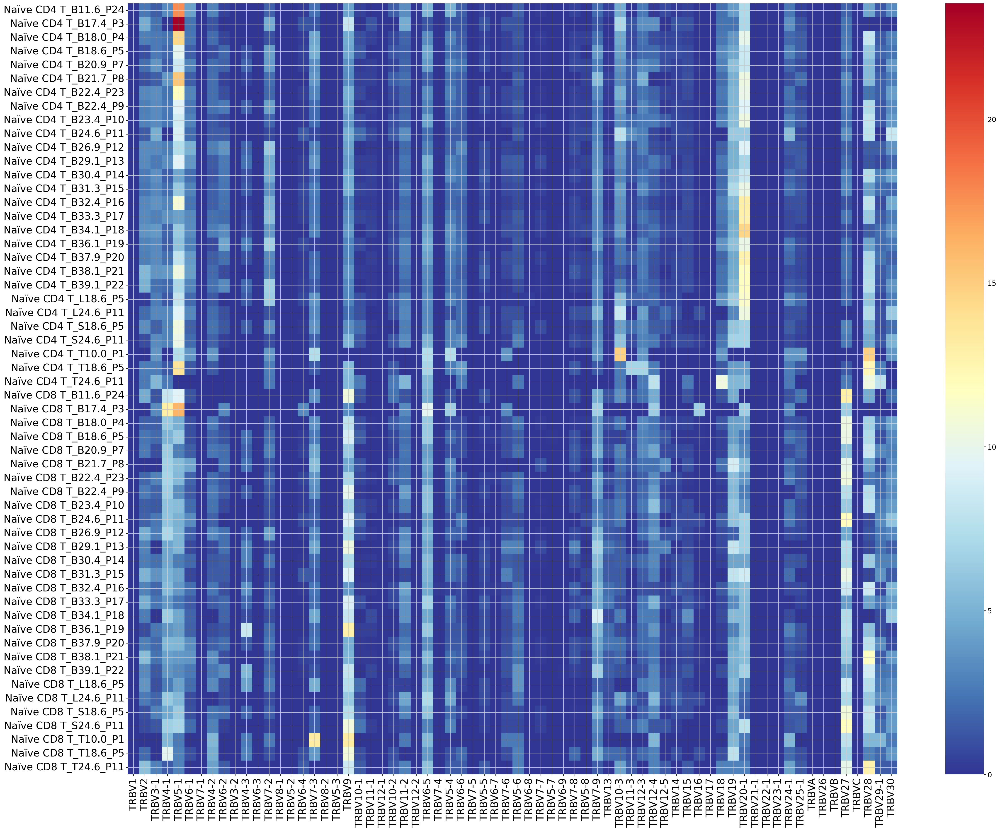

In [63]:
CD48TCR_chain, BCRHfig = calculate_TCRVDJ_heatmap2(adata_noT12,TRBVlist_values ,input_IR='IR_VDJ_1_v_call',input_cell_type=['Naïve CD4 T','Naïve CD8 T'])

In [64]:
CD48TCRA_chainlong=CD48TCRA_chain.reset_index().rename(columns={'index': 'Sample'}).melt(id_vars=['Sample'])
CD48TCRA_chainlong

,Sample,variable,value
0,Naïve CD4 T_B11.6_P24,TRAV1-1,1.741294
1,Naïve CD4 T_B17.4_P3,TRAV1-1,2.352941
2,Naïve CD4 T_B18.0_P4,TRAV1-1,2.925532
3,Naïve CD4 T_B18.6_P5,TRAV1-1,0.929512
4,Naïve CD4 T_B20.9_P7,TRAV1-1,0.943396
...,...,...,...
3411,Naïve CD8 T_S18.6_P5,TRAV46,0.0
3412,Naïve CD8 T_S24.6_P11,TRAV46,0.0
3413,Naïve CD8 T_T10.0_P1,TRAV46,0.0
3414,Naïve CD8 T_T18.6_P5,TRAV46,0.0


In [93]:
adata_noT12.obs.IR_VDJ_1_d_call.value_counts()

TRBD1    9797
TRBD2    3321
Name: IR_VDJ_1_d_call, dtype: int64

/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_script_in_save/TCRutil.py:50: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  selected_adata.obs['Organ_cell_type'] = selected_adata.obs['Last_cell_type'].astype('str') + "_" + selected_adata.obs['AdjustedID'].astype('str')


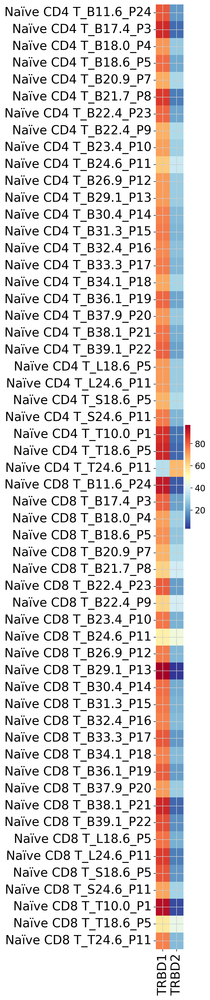

In [91]:
CD48TCRD_chain, BCRHfig = calculate_TCRVDJ_heatmap2(adata_noT12,TRBDIMGT,input_IR='IR_VDJ_1_d_call',input_cell_type=['Naïve CD4 T','Naïve CD8 T'])

In [94]:
TCRBD_chainlong=CD48TCRD_chain.reset_index().rename(columns={'index': 'Sample'}).melt(id_vars=['Sample'])

In [65]:
TCRH_chainlong=CD48TCR_chain.reset_index().rename(columns={'index': 'Sample'}).melt(id_vars=['Sample'])
TCRH_chainlong
CD48TCRAJ_long=CD48TCRAJ_chain.reset_index().rename(columns={'index': 'Sample'}).melt(id_vars=['Sample'])
CD48TCRBJ_long=CD48TCRBJ_chain.reset_index().rename(columns={'index': 'Sample'}).melt(id_vars=['Sample'])

In [66]:
CD48TCRAJ_long

,Sample,variable,value
0,Naïve CD4 T_B11.6_P24,TRAJ61,0.0
1,Naïve CD4 T_B17.4_P3,TRAJ61,0.0
2,Naïve CD4 T_B18.0_P4,TRAJ61,0.0
3,Naïve CD4 T_B18.6_P5,TRAJ61,0.0
4,Naïve CD4 T_B20.9_P7,TRAJ61,0.0
...,...,...,...
3411,Naïve CD8 T_S18.6_P5,TRAJ1,0.0
3412,Naïve CD8 T_S24.6_P11,TRAJ1,0.0
3413,Naïve CD8 T_T10.0_P1,TRAJ1,0.0
3414,Naïve CD8 T_T18.6_P5,TRAJ1,0.0


/data1/maolp/mamba/envs/Pyscan/lib/python3.9/site-packages/rpy2/robjects/pandas2ri.py:65: UserWarning: Error while trying to convert the column "value". Fall back to string conversion. The error is: <class 'float'>
  warnings.warn('Error while trying to convert '


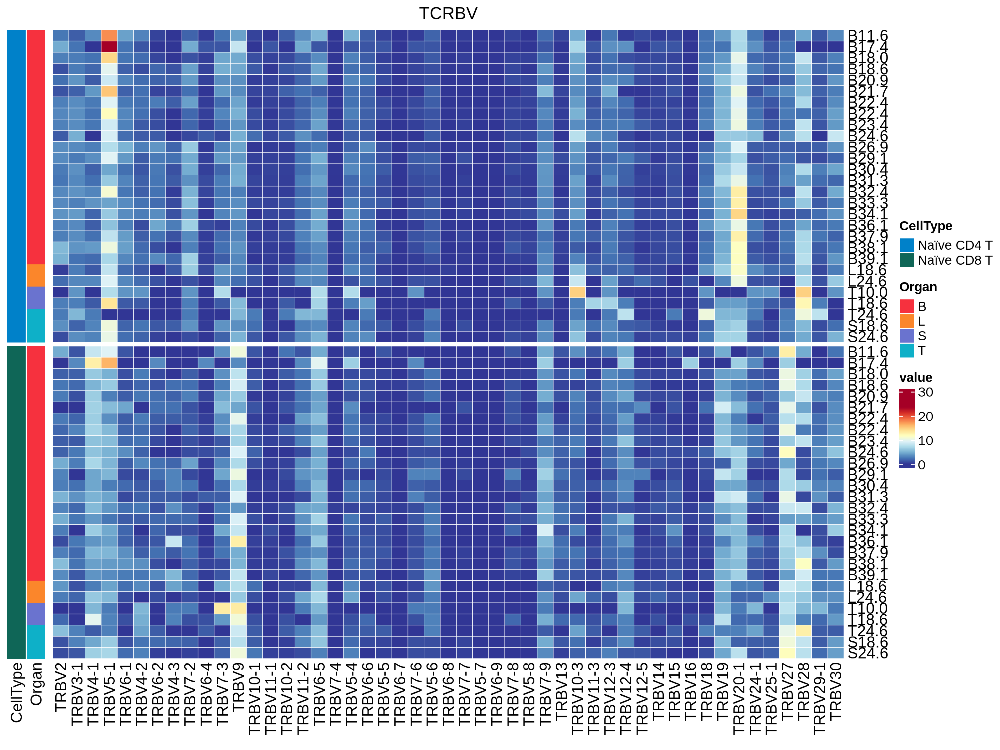

In [67]:
%%R  -w 3200 -h 2400 -r 300 -i TCRH_chainlong -i TRBVlist_values

library(tidyverse)
library(scales)
library(ggplot2)
library(dplyr)
library(RColorBrewer )
library(ComplexHeatmap)
TCRH=TCRH_chainlong
TCRH$variable<-factor(TCRH$variable,level=TRBVlist_values)

library(dplyr)



split_TCRH<- strsplit(TCRH$Sample, "_")


TCRH$CellType <- sapply(split_TCRH, "[", 1)
TCRH$AdjusteID<- sapply(split_TCRH, "[", 2)

TCRH$Organ <- substr(TCRH$AdjusteID, 1, 1)
TCRH$Sample<-factor(TCRH$Sample,level=rev(sort(unique(TCRH$Sample))))
TCRH2 <- TCRH %>% group_by(variable) %>% filter(sum(as.numeric(value) )!= 0) %>%ungroup()

# 创建一个新的列，包含 CellType 和 Organ 的组合
TCRH2$CellType_Organ <- paste(TCRH2$CellType, TCRH2$Organ, sep = "_")

wide_data <- spread(TCRH2, variable, value)
rownames(wide_data) <- wide_data$Sample
wide_data$Sample <- NULL 


annotations <- TCRH2 %>% 
  select(Sample, CellType, Organ) %>% 
  distinct() %>% 
  column_to_rownames("Sample")


annotations[] <- lapply(annotations, as.factor)



# annotations[] <- lapply(annotations, as.factor)

library(dplyr)
library(stringr)


wide_data <- wide_data %>%
  mutate(AdjustedID_num = as.numeric(str_extract(AdjusteID, "\\d+\\.\\d")))


wide_data$Organ <- factor(wide_data$Organ, levels = c("B", "L", "T", "S"))


wide_data <- wide_data %>% arrange(CellType,Organ, AdjustedID_num)
# wide_data
wide_data <- wide_data %>%
  select(-AdjustedID_num)

mat <- sapply(wide_data[,-c(1:4)], as.numeric)

rownames(mat)<-wide_data$AdjusteID


annotation_colors <- list(
  CellType = c('Naïve CD4 T' = "#0081C9", 'Naïve CD8 T' = "#0f6657"),
  Organ = c(B = "#F6313E", L = "#fb862b",T = "#0eb0c8", S = "#6a73cf")
)

color_vector <-  rev(colorRampPalette(brewer.pal(11, "RdYlBu"))(100))


row_anno <- rowAnnotation(df = annotations, col = annotation_colors)

row_split_vector <- c(rep(1, 28), rep(2, nrow(mat) - 28))
# row_split_vector <- c(rep(1, 21), rep(2, 2),rep(3, 2),rep(4, 2),rep(5, 21),rep(6,2),rep(7,2),rep(8,nrow(mat)-21-2-2-2-21-4-2))
row_split_vector
TCRH_heatmap <- Heatmap(mat, 
  name = "value",
  col = color_vector,
  cluster_rows = FALSE, row_title = NULL ,
  cluster_columns = F,
rect_gp = gpar(col = "white", lwd = 0.5),column_title = "TCRBV",
                   row_split = row_split_vector,show_row_names = TRUE)      


row_anno+TCRH_heatmap

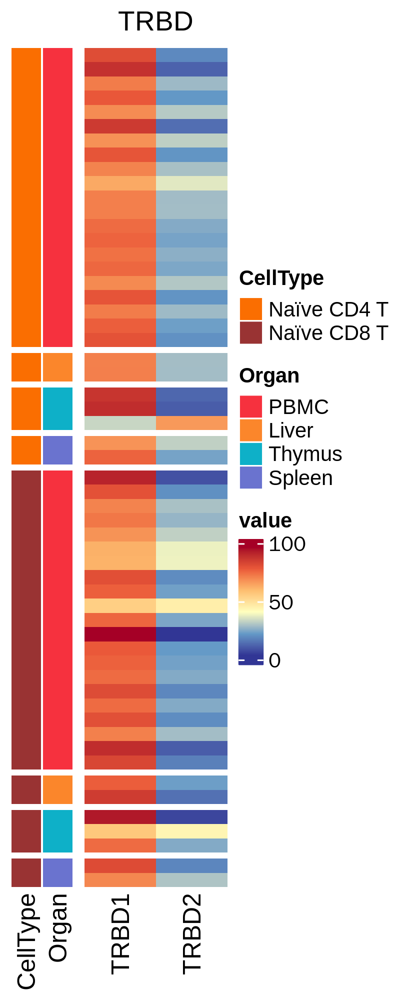

In [104]:
%%R  -w 800 -h 2000 -r 300 -i TCRBD_chainlong -i TRBDIMGT
TCRDheatmap <- TCRgene_heatmap(TCRBD_chainlong, TRBDIMGT,titlename="TRBD")
# print(heatmap)
TCRDheatmap[[1]]+TCRDheatmap[[2]]

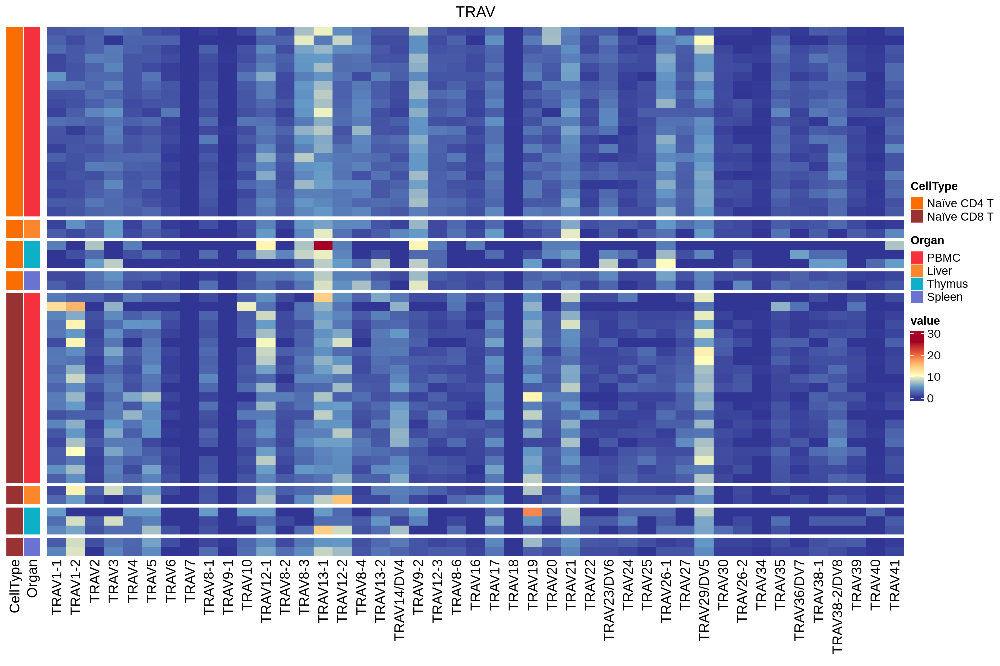

In [85]:
%%R  -w 3600 -h 2400 -r 300 -i CD48TCRA_chainlong -i TRAVlist_values
TCRAVheatmap <- TCRgene_heatmap(CD48TCRA_chainlong, TRAVlist_values,titlename="TRAV")
# print(heatmap)
TCRAVheatmap[[1]]+TCRAVheatmap[[2]]

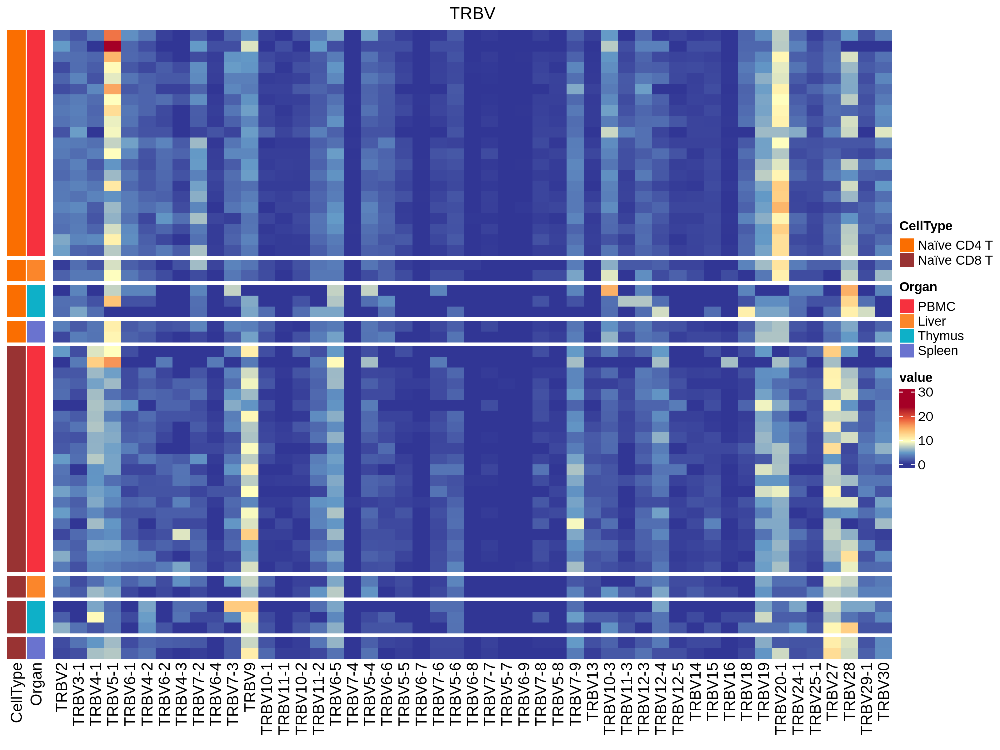

In [70]:
%%R   -w 3200 -h 2400 -r 300  -i TRBVlist_values


TCRHVheatmap <- TCRgene_heatmap(TCRH_chainlong, TRBVlist_values,titlename='TRBV')

TCRHVheatmap[[1]]+TCRHVheatmap[[2]]
# row_anno3+TCRH_heatmap

In [71]:
%%R
rev(colorRampPalette(brewer.pal(11, "RdYlBu"))(7))

[1] "#313695" "#649AC7" "#BCE1EE" "#FFFFBF" "#FDBE70" "#EA5839" "#A50026"


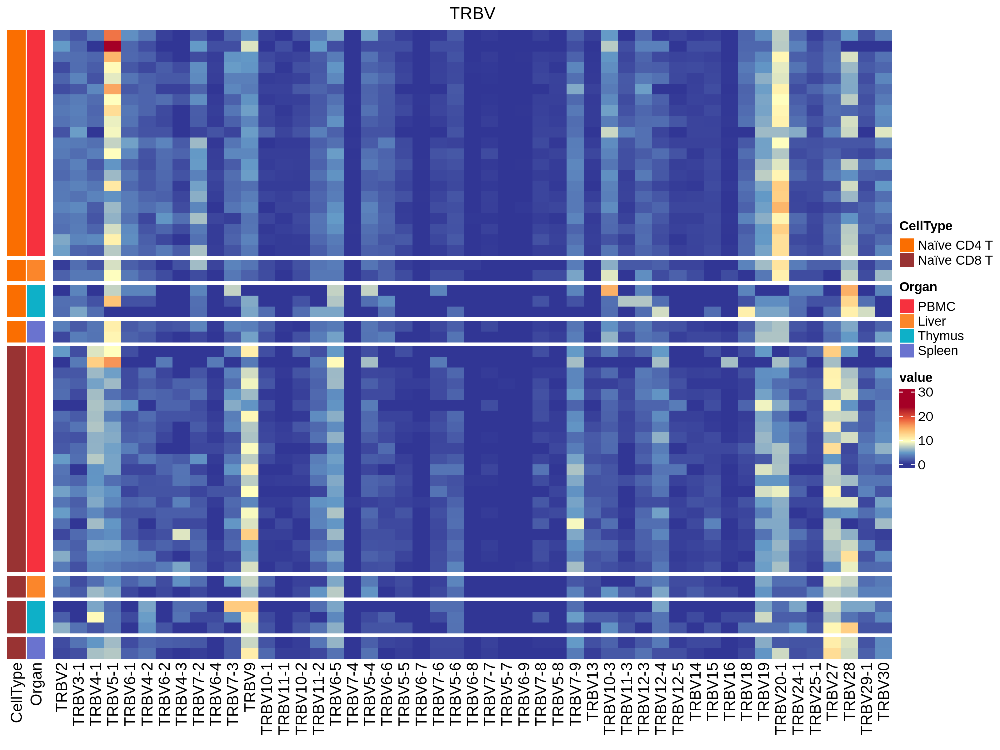

In [72]:
%%R   -w 3200 -h 2400 -r 300 -i TCRH_chainlong -i TRBVlist_values


TCRHVheatmap <- TCRgene_heatmap(TCRH_chainlong, TRBVlist_values,titlename='TRBV')
# print(heatmap)
TCRHVheatmap[[1]]+TCRHVheatmap[[2]]
# row_anno3+TCRH_heatmap

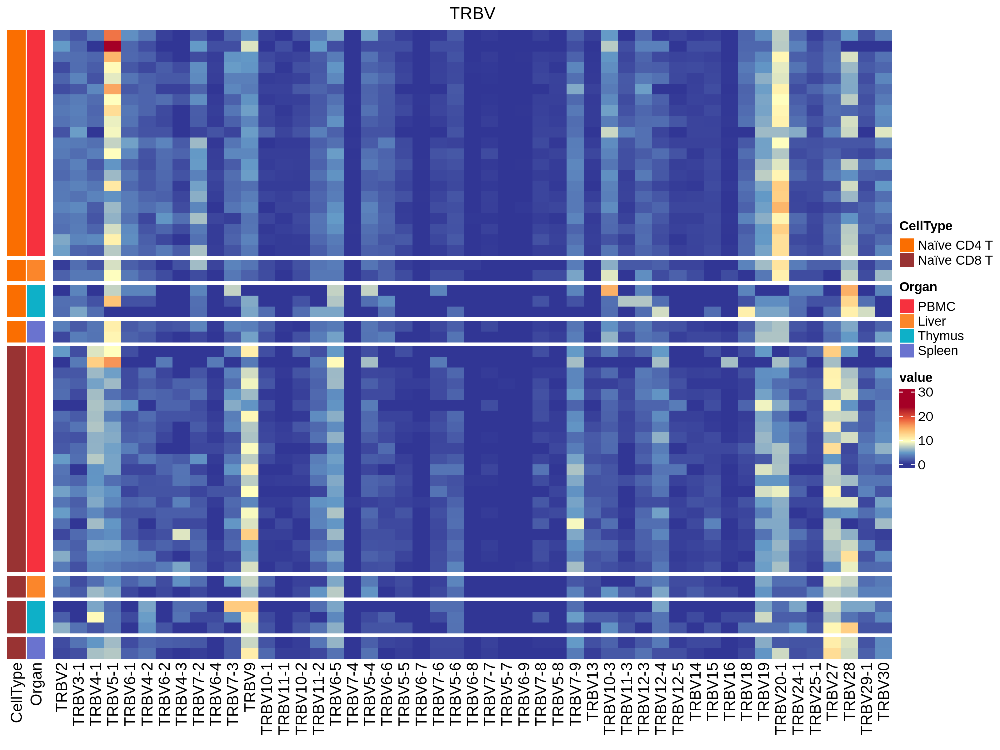

In [73]:
%%R   -w 3200 -h 2400 -r 300 -i TCRH_chainlong -i TRBVlist_values


TCRHVheatmap <- TCRgene_heatmap(TCRH_chainlong, TRBVlist_values,titlename='TRBV')
# print(heatmap)
TCRHVheatmap[[1]]+TCRHVheatmap[[2]]
# row_anno3+TCRH_heatmap

In [ ]:
# TRAJIMGT

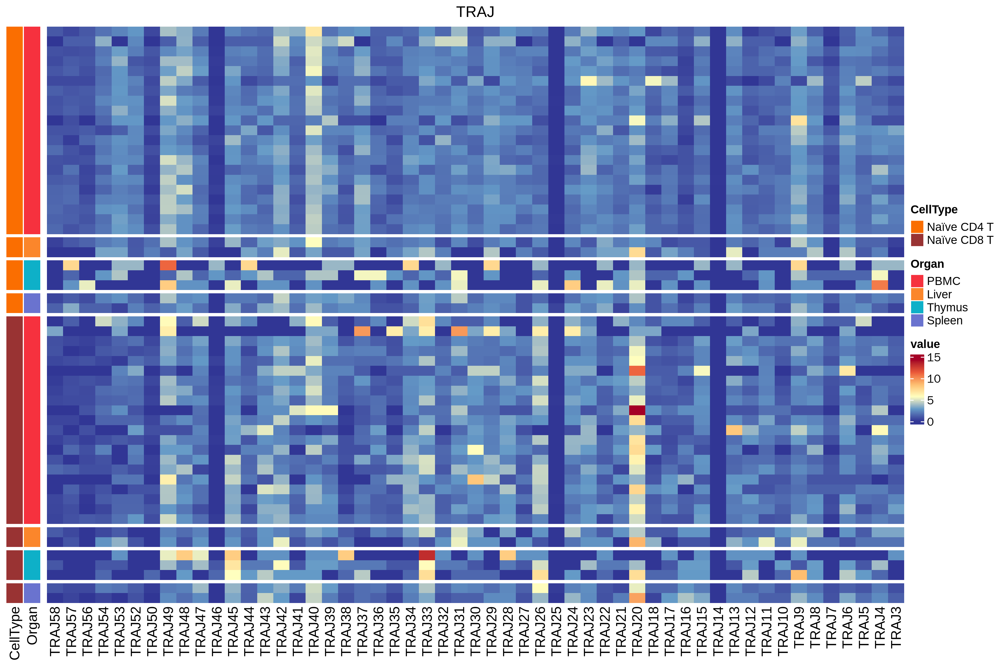

In [74]:
%%R  -w 3600 -h 2400 -r 300 -i CD48TCRAJ_long -i TRAJIMGT
TCRAJheatmap <- TCRgene_heatmap(CD48TCRAJ_long, TRAJIMGT,titlename="TRAJ")
# print(heatmap)
TCRAJheatmap[[1]]+TCRAJheatmap[[2]]

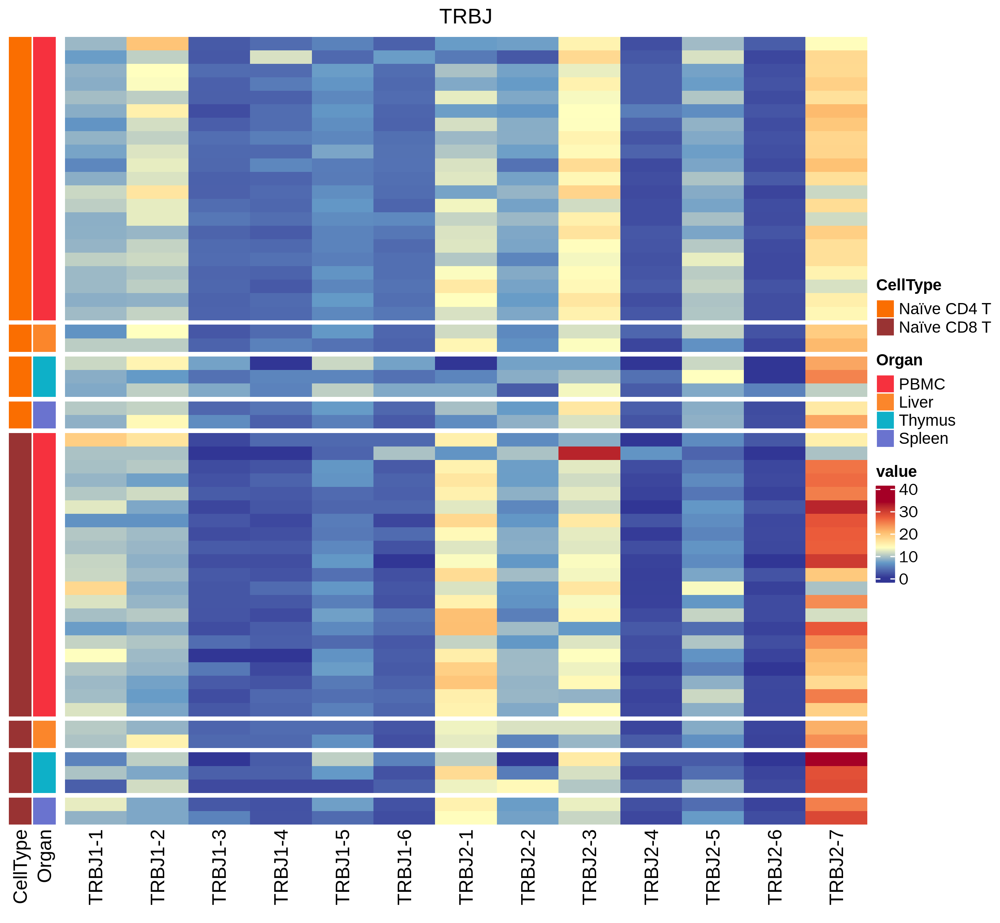

In [75]:
%%R  -w 2600 -h 2400 -r 300 -i CD48TCRBJ_long -i TRBJIMGT
TCRBJheatmap <- TCRgene_heatmap(CD48TCRBJ_long, TRBJIMGT,titlename="TRBJ")
# print(heatmap)
TCRBJheatmap[[1]]+TCRBJheatmap[[2]]

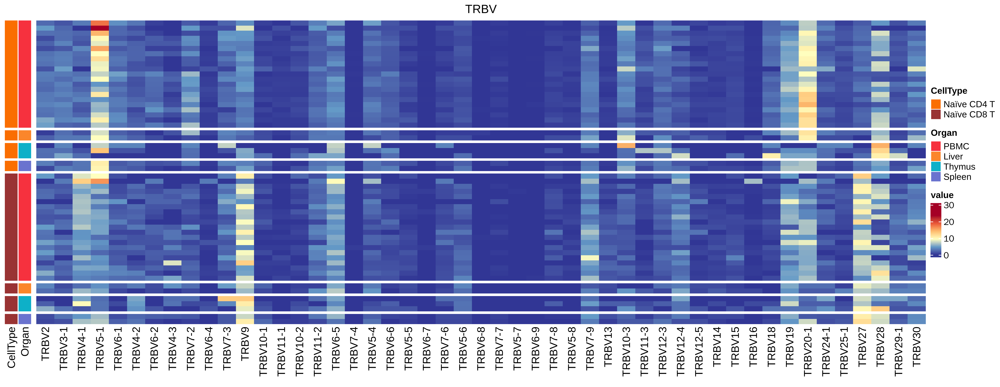

In [78]:
%%R  -w 6200 -h 2400 -r 400
TCRHVheatmap[[1]]+TCRHVheatmap[[2]]+TCRDheatmap[[2]]

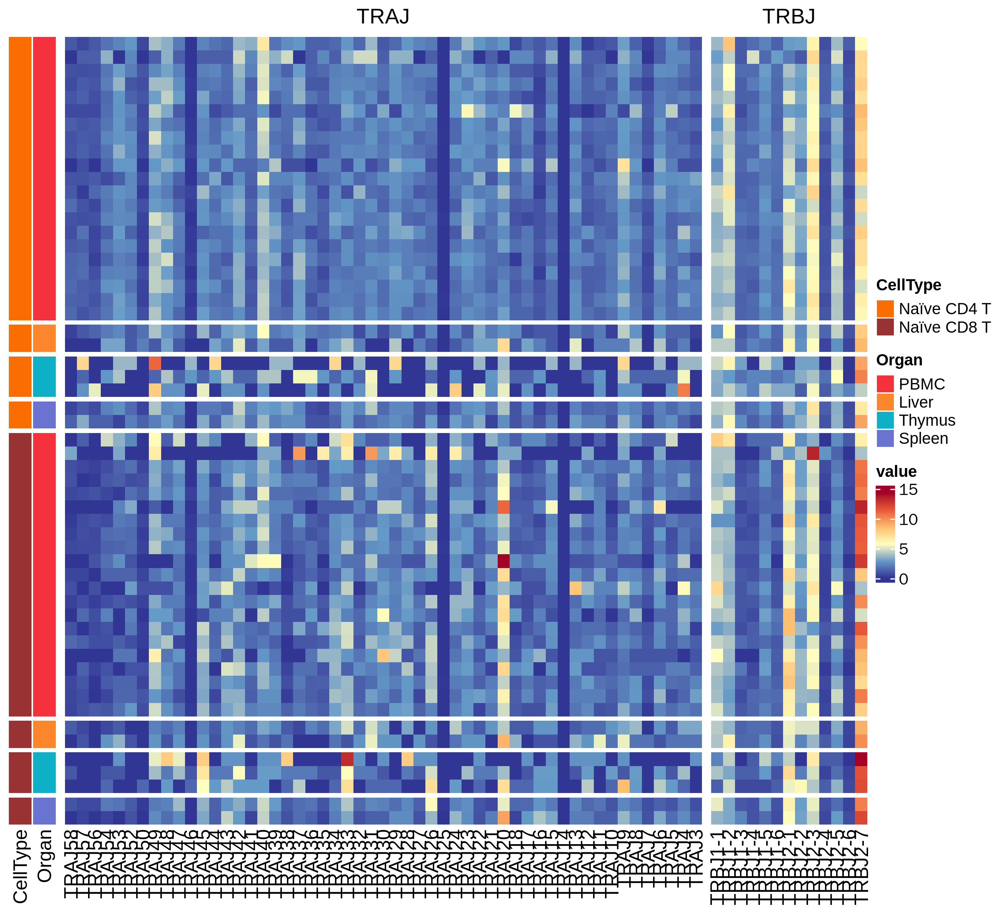

In [106]:
%%R  -w 2600 -h 2400 -r 300
TCRAJheatmap[[1]]+TCRAJheatmap[[2]]+TCRBJheatmap[[2]]

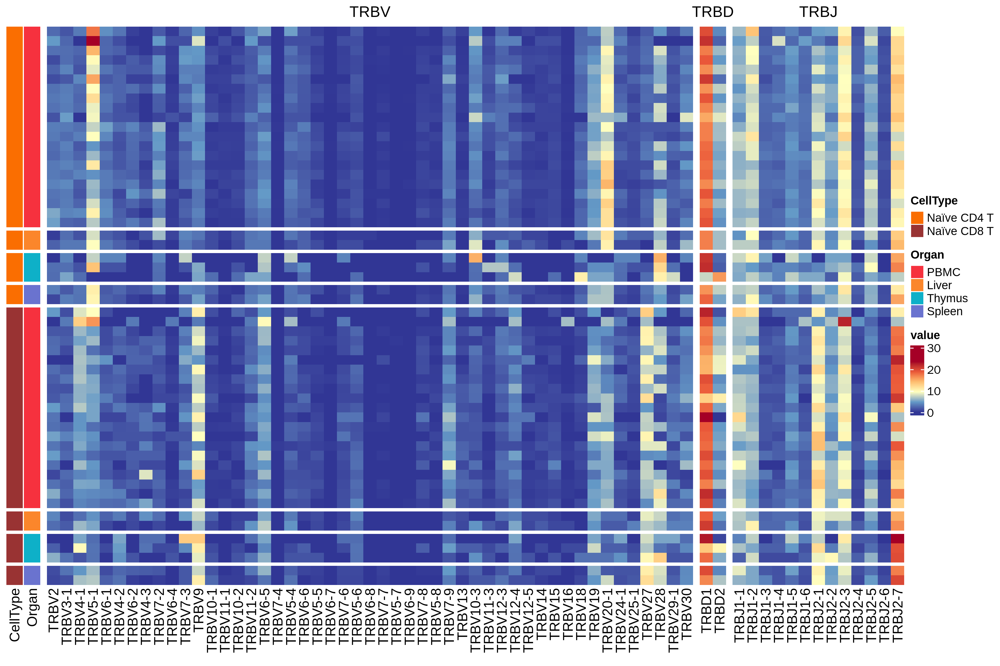

In [108]:
%%R  -w 3600 -h 2400 -r 300
TCRHVheatmap[[1]]+TCRHVheatmap[[2]]+TCRDheatmap[[2]]+TCRBJheatmap[[2]]

In [ ]:
mkdir -p /data5/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S27

In [ ]:
%%R  -w 6200 -h 2400 -r 400


pdf("/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S27/S27A_TRBV_all_heatmap.pdf", width = 10, height = 6)


print(TCRHVheatmap[[1]]+TCRHVheatmap[[2]])


dev.off()

In [81]:
%%R  -w 6200 -h 2400 -r 400


pdf("/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S27/S27A_TRBJ_all_heatmap.pdf", width = 4, height = 6)


print(TCRBJheatmap[[1]]+TCRBJheatmap[[2]])


dev.off()

[1] 2


In [109]:
%%R  -w 6200 -h 2400 -r 400


pdf("/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S27/S27A_TRBVDJ_all_heatmap.pdf", width = 14, height = 6)


print(TCRHVheatmap[[1]]+TCRHVheatmap[[2]]+TCRDheatmap[[2]]+TCRBJheatmap[[2]])


dev.off()

[1] 2


In [82]:
%%R  -w 6200 -h 2400 -r 400


pdf("/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S27/S27A_TRBVJ_all_heatmap.pdf", width = 14, height = 6)


print(TCRBJheatmap[[1]]+TCRHVheatmap[[2]]+TCRBJheatmap[[2]])


dev.off()

[1] 2


In [86]:
%%R  -w 6200 -h 2400 -r 400


pdf("/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S27/S27B_TRAVJ_all_heatmap.pdf", width = 16, height = 6)


print(TCRAJheatmap[[1]]+TCRAVheatmap[[2]]+TCRAJheatmap[[2]])


dev.off()

[1] 2


In [ ]:
%%R  -w 6200 -h 2400 -r 400


pdf("/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S27/S27A_TRDJ_all_heatmap.pdf", width = 10, height = 6)


print(TCRAJheatmap[[1]]+TCRAJheatmap[[2]])


dev.off()

In [ ]:
%%R  -w 6200 -h 2400 -r 400


pdf("/data5/maolp/Main_Gao_ScanpyProject20231130/HFB_Figure_Plot/Sup_Figure4/S27/S27A_TRAJ_all_heatmap.pdf", width = 10, height = 6)


print(TCRAJheatmap[[1]]+TCRAJheatmap[[2]])


dev.off()

In [ ]:
# %%R
# source("/home/maolp/Main_Gao_ScanpyProject20231130/HFB_script_in_save/TCRheatmap.R")

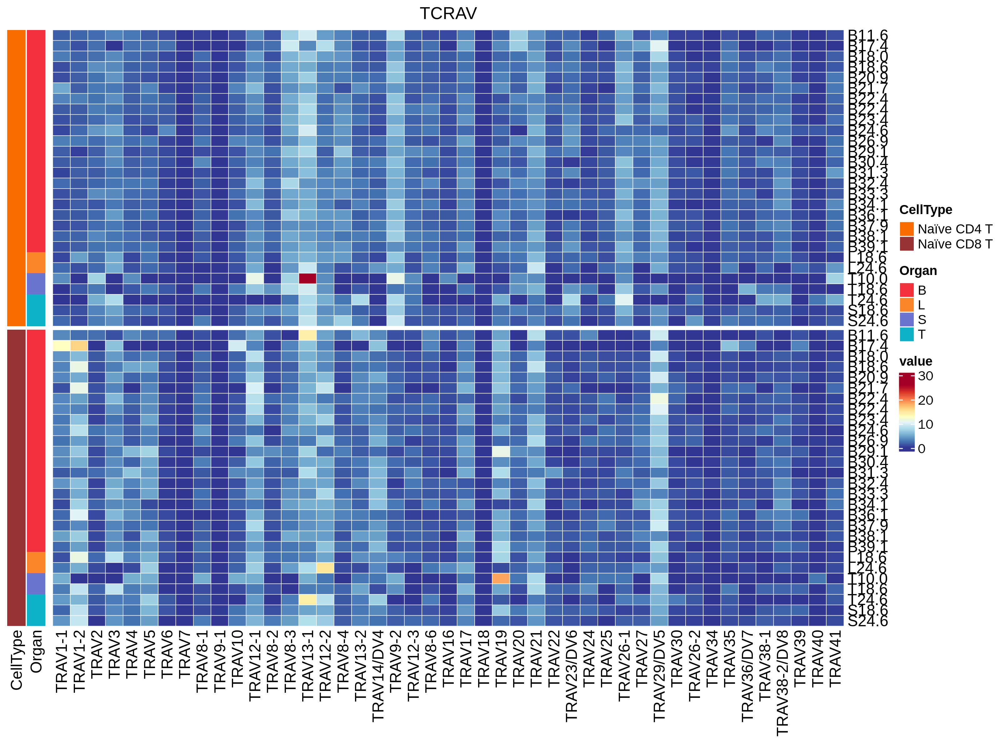

In [84]:
%%R  -w 3200 -h 2400 -r 300  -i CD48TCRA_chainlong -i TRAVlist_values
CD48TCRAheat=TCR_Data_heatmap(CD48TCRA_chainlong,TRAVlist_values)
CD48TCRAheat[[1]]+CD48TCRAheat[[2]]

In [ ]:
# %%R  -w 6200 -h 2400 -r 400
# row_anno+CD48TCRA_heatmap+TCRH_heatmap

In [ ]:
# %%R  -w 6200 -h 2400 -r 400
# row_anno+CD48TCRA_heatmap+TCRH_heatmap2

In [ ]:
# pwd
!mkdir -p ~/Allcount/Last_All_scanpyData/BCRTCRchain

In [ ]:
%%R
# head(TCRH2)
# write.csv(TCRH_chainlong,'~/Allcount/All_scanpyData/BCRTCRchain/TCRH_chainlong.csv')

In [ ]:
%%R
# head(TCRH2)
# write.csv(TRAVlist_values,'~/Allcount/All_scanpyData/BCRTCRchain/TRAVlist_values.csv')

In [ ]:
%%R
# head(TCRH2)
# write.csv(CD48TCRA_chainlong,'~/Allcount/All_scanpyData/BCRTCRchain/CD48TCRA_chainlong.csv')

In [ ]:
%%R
# write.csv(TRBVlist_values,'/home/maolp/Allcount/All_scanpyData/BCRTCRchain/TRBVlist_values.csv')

In [110]:
%%R


long_variables <- ls(pattern = "long")


folder_path <- "~/Allcount/All_scanpyData/TCRchain"


if (!dir.exists(folder_path)) {
  dir.create(folder_path, recursive = TRUE)
}


for (var_name in long_variables) {
  
  var_value <- get(var_name)
  print(var_name)

  file_name <- paste0(var_name, ".csv")
  
  file_path <- file.path(folder_path, file_name)

  write.csv(var_value, file_path, row.names = FALSE)
}

[1] "CD48TCRA_chainlong"
[1] "CD48TCRAJ_long"
[1] "CD48TCRBJ_long"
[1] "TCRBD_chainlong"
[1] "TCRH_chainlong"


In [ ]:
rm -rf /home/maolp/Allcount/All_scanpyData/TCRchain/long_variables.csv